<a href="https://colab.research.google.com/github/AmmarNasirEngr/Brain_Tumor_Detection_By_Ammar_Nasir/blob/main/Brain_Tumor_Detection_By_Ammar_Nasir.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🧠 Brain Tumor Detection with YOLOv8

**Author:** Ammar Nasir  
**Model:** YOLOv8s (fine-tuned)  
**Task:** Object Detection — Brain Tumor Localization in MRI scans  

---

## Project Overview

This notebook fine-tunes a YOLOv8s model on an MRI brain tumor dataset to detect and localize tumors in medical images. The pipeline covers: dependency setup → dataset loading → model training → validation → inference on new MRI scans → ONNX export for deployment.

## Dataset

- **Source:** Google Drive (Brain Tumor YOLOv8 dataset, YOLOv8 format, 640px)
- **Drive File ID:** `1R-Ckl-CwGD4Xuj6WEEwUQkdO8uCgB19E`
- **Splits:** `train` / `valid` / `test`
- To replicate, download the dataset using `gdown` as shown in the Dataset Setup section below.

## Model Architecture

- **Base model:** YOLOv8s pretrained on COCO
- **Fine-tuning:** 5 epochs, image size 640, batch 16, AdamW optimizer, `fraction=0.1` for fast iteration
- **Framework:** [Ultralytics YOLOv8](https://github.com/ultralytics/ultralytics)

## Key Results

> ⚠️ Update this section after running training with your actual metrics.

| Metric | Value |
|---|---|
| mAP@0.5:0.323 | — |
| mAP@0.5:0.95:0.126 | — |
| Precision 0.408 | — |
| Recall 0.359 | — |

---

## Key Results

| Metric | All Classes | label0 | label1 | label2 |
|---|---|---|---|---|
| **Precision** | 0.408 | 0.341 | 0.488 | 0.401 |
| **Recall** | 0.357 | 0.211 | 0.602 | 0.257 |
| **mAP@0.5** | 0.322 | 0.193 | 0.548 | 0.227 |
| **mAP@0.5:0.95** | 0.126 | 0.062 | 0.244 | 0.074 |

> Validated on 1,980 images (4,381 instances). Trained with `fraction=0.1` and only 5 epochs — these numbers reflect a lightweight baseline run, not a fully converged model. Expect significant improvement with full data and 50+ epochs.

## Phase 1 — Install Dependencies


In [1]:
!pip install ultralytics roboflow gdown -q


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.9/207.9 kB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 89.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 117.5 MB/s eta 0:00:00


## Phase 2 — Imports


In [2]:
from ultralytics import YOLO
import torch
import os


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## Phase 3 — GPU Check


In [3]:
print("CUDA Available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("No GPU detected. Training will run on CPU (significantly slower).")


CUDA Available: True
GPU: Tesla T4


## Phase 4 — Dataset Setup

Downloads the zipped dataset from Google Drive using `gdown`, then extracts it locally.  
> **Note:** If you're running this outside Colab, update `extract_dir` to your preferred local path.


In [6]:
import os
from google.colab import drive

# Mount Google Drive
print("Mounting Google Drive...")
drive.mount('/content/drive')

# Set the path to your dataset folder on Google Drive
# IMPORTANT: Ensure the folder 'brain_tumor_yolo' exists in your Google Drive
# and contains the unzipped dataset. You might need to adjust the path
# if your folder has a different name or location.
extract_dir = '/content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset'

print(f"Dataset location set to: {extract_dir}")

# Check if the directory exists
if not os.path.exists(extract_dir):
    print(f"Error: Dataset directory not found at {extract_dir}. "
          "Please ensure the folder is correctly placed in your Google Drive "
          "and the path is accurate.")
else:
    print("Dataset folder found.")

Mounting Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Dataset location set to: /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset
Dataset folder found.


## Phase 5 — Dataset Verification


In [8]:
def count_files_in_directory(path):
    count = 0
    if os.path.exists(path) and os.path.isdir(path):
        for root, _, files in os.walk(path):
            count += len(files)
    return count

print(f"Top-level contents: {os.listdir(extract_dir)}\n")

for split in ['train', 'valid', 'test']:
    split_path = os.path.join(extract_dir, split)
    if os.path.isdir(split_path):
        total = count_files_in_directory(split_path)
        print(f"{split}: {total} files")
        for sub in ['images', 'labels']:
            sub_path = os.path.join(split_path, sub)
            if os.path.isdir(sub_path):
                print(f"  └─ {sub}: {len(os.listdir(sub_path))} files")
    else:
        print(f"{split}: directory not found")


Top-level contents: ['valid', 'test', 'train', 'README.dataset.txt', 'data.yaml', 'README.roboflow.txt']

train: 13861 files
  └─ images: 6930 files
  └─ labels: 6930 files
valid: 3961 files
  └─ images: 1980 files
  └─ labels: 1980 files
test: 1980 files
  └─ images: 990 files
  └─ labels: 990 files


## Phase 6 — Load Pretrained YOLOv8s Model


In [9]:
model = YOLO("yolov8s.pt")


## Phase 7 — Fine-Tune on Brain Tumor Dataset

Key hyperparameters:
- `epochs=5` — quick iteration run; increase to 50–100 for production quality
- `fraction=0.1` — trains on 10% of data; remove or set to 1.0 for full training
- `batch=16`, `imgsz=640`, `optimizer=AdamW`, `lr0=0.001`


In [10]:
results = model.train(
    data=os.path.join(extract_dir, "data.yaml"),
    epochs=5,
    imgsz=640,
    batch=16,
    fraction=0.1,
    val=True,
    device=0,
    optimizer="AdamW",
    lr0=0.001,
    patience=20,
    workers=2,
    project="brain_tumor_project",
    name="yolov8_brain_tumor"
)


Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=0.1, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8_brain_tumor, nbs=64, nms=False, opset=None, 

## Phase 8 — Validate Model


In [11]:
metrics = model.val()
print(metrics)


Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.6±0.3 ms, read: 8.4±4.9 MB/s, size: 25.5 KB)
val: Scanning /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/valid/labels.cache... 1980 images, 16 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1980/1980 553.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 124/124 2.8it/s 43.5s
                   all       1980       4381      0.408      0.359      0.323      0.126
                label0       1246       1246      0.339      0.214      0.193     0.0617
                label1       1945       1945      0.484      0.601      0.548      0.244
                label2       1190       1190      0.399      0.262      0.228      0.074
Speed: 1.3ms preprocess, 9.0ms inference, 0.0ms loss, 1.2ms postprocess per 

## Phase 9 — Visualize Training Results

Displays training plots (confusion matrix, PR curve, F1 curve, etc.) saved in the run directory.


Loading results from: runs/detect/brain_tumor_project/yolov8_brain_tumor


**BoxF1_curve.png**

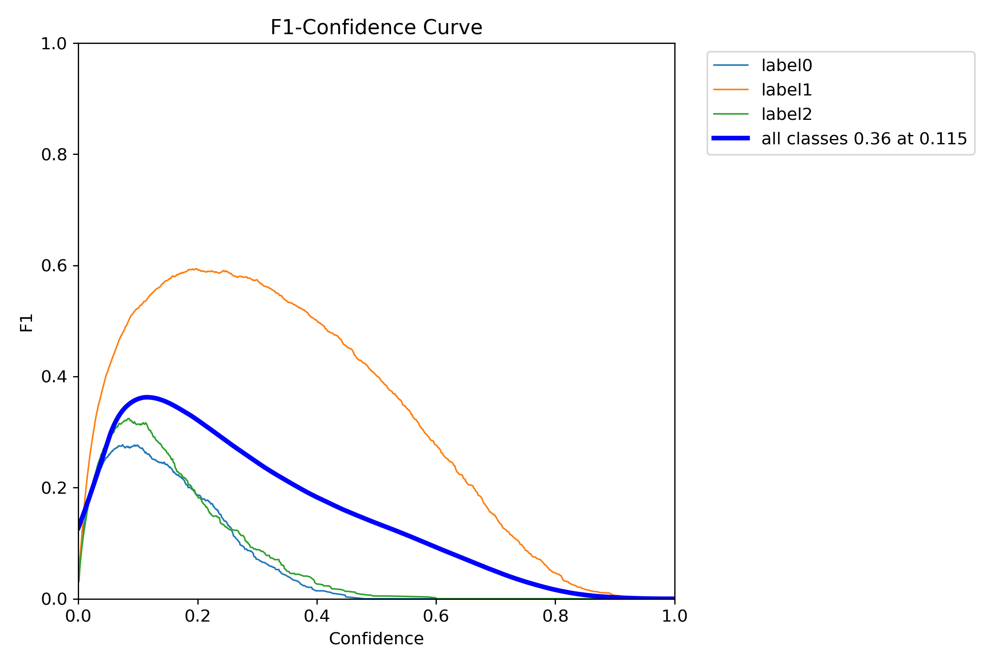

**BoxPR_curve.png**

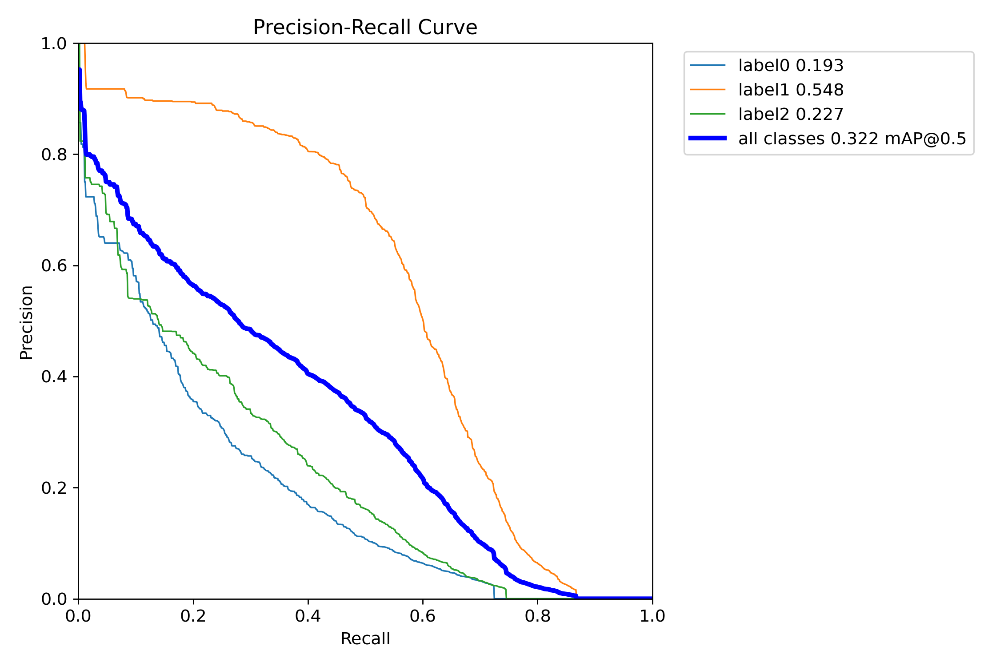

**BoxP_curve.png**

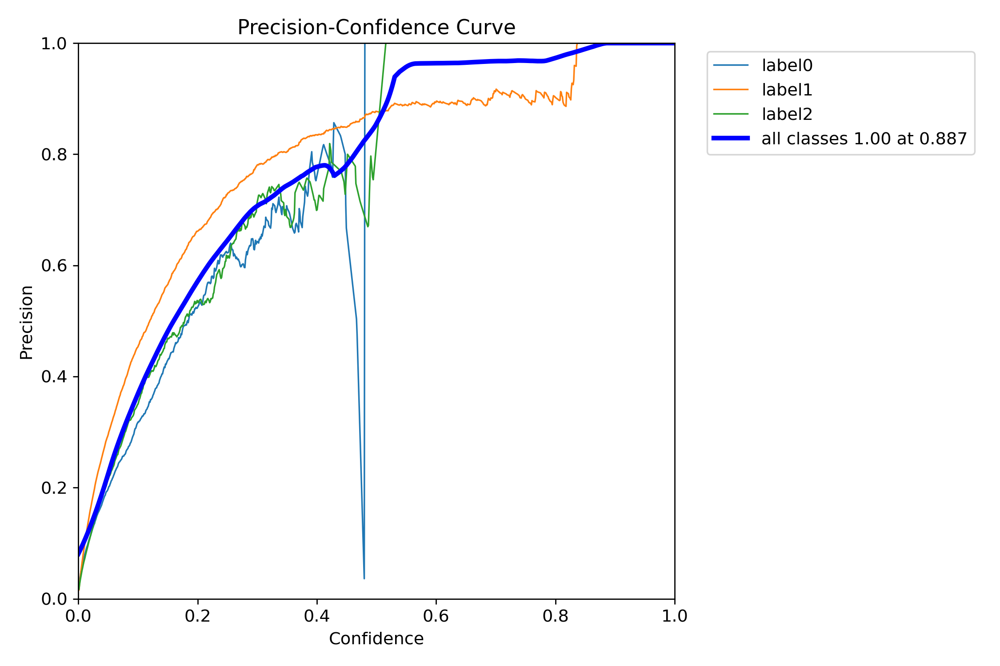

**BoxR_curve.png**

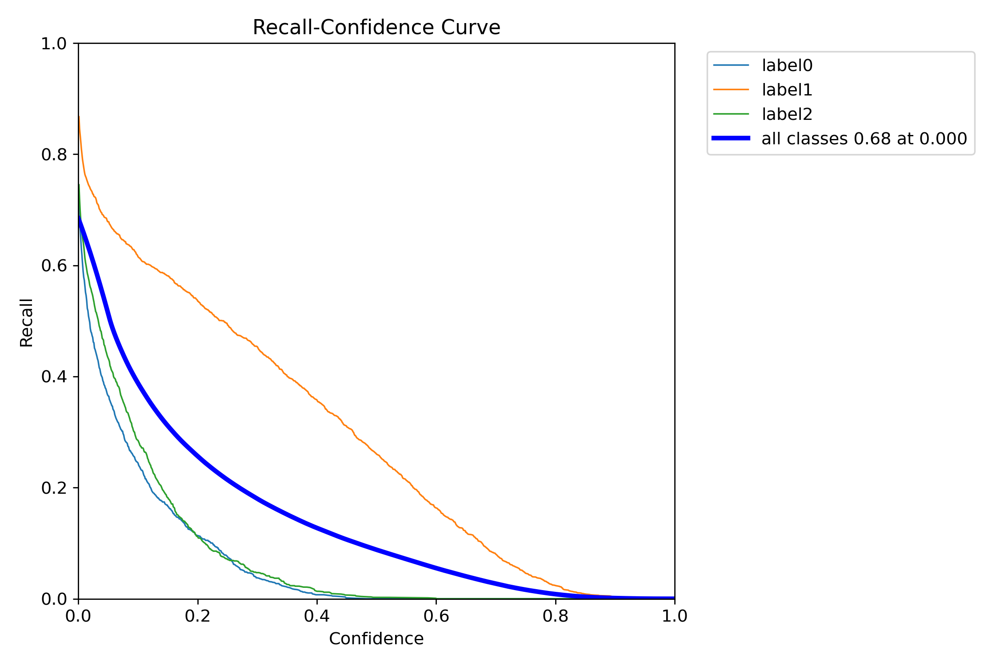

**confusion_matrix.png**

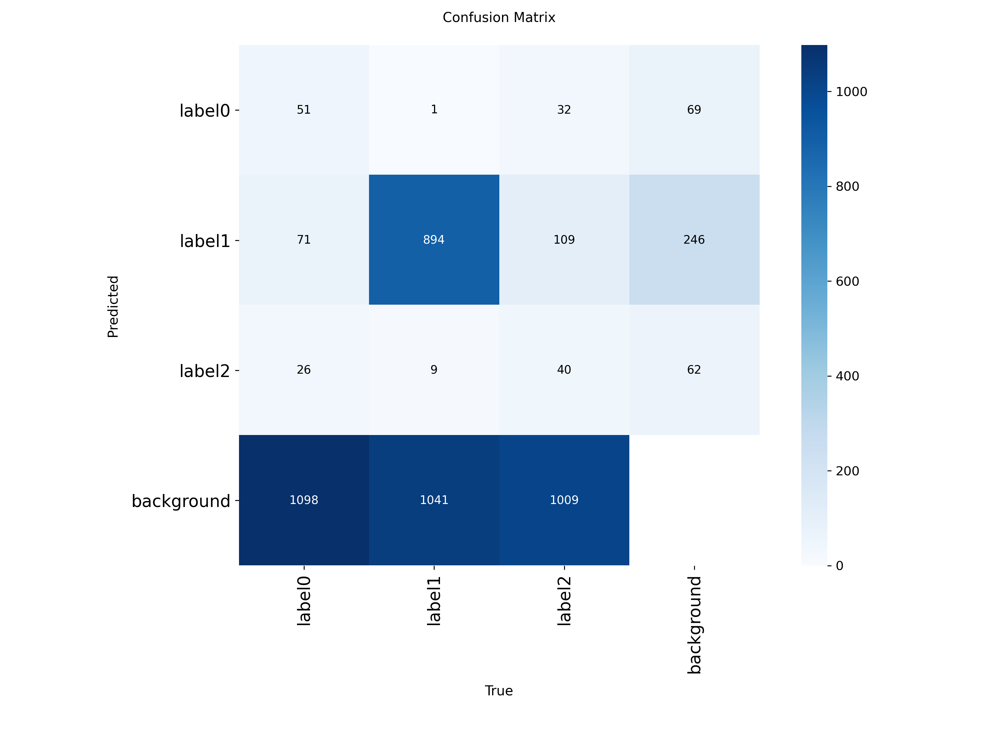

**confusion_matrix_normalized.png**

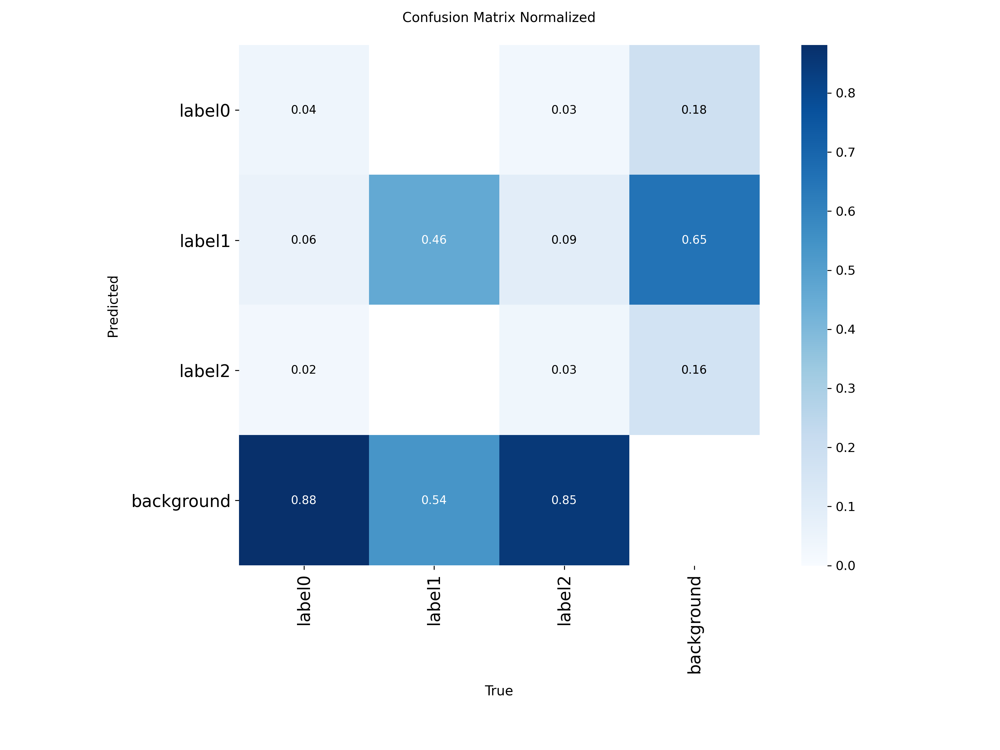

**labels.jpg**

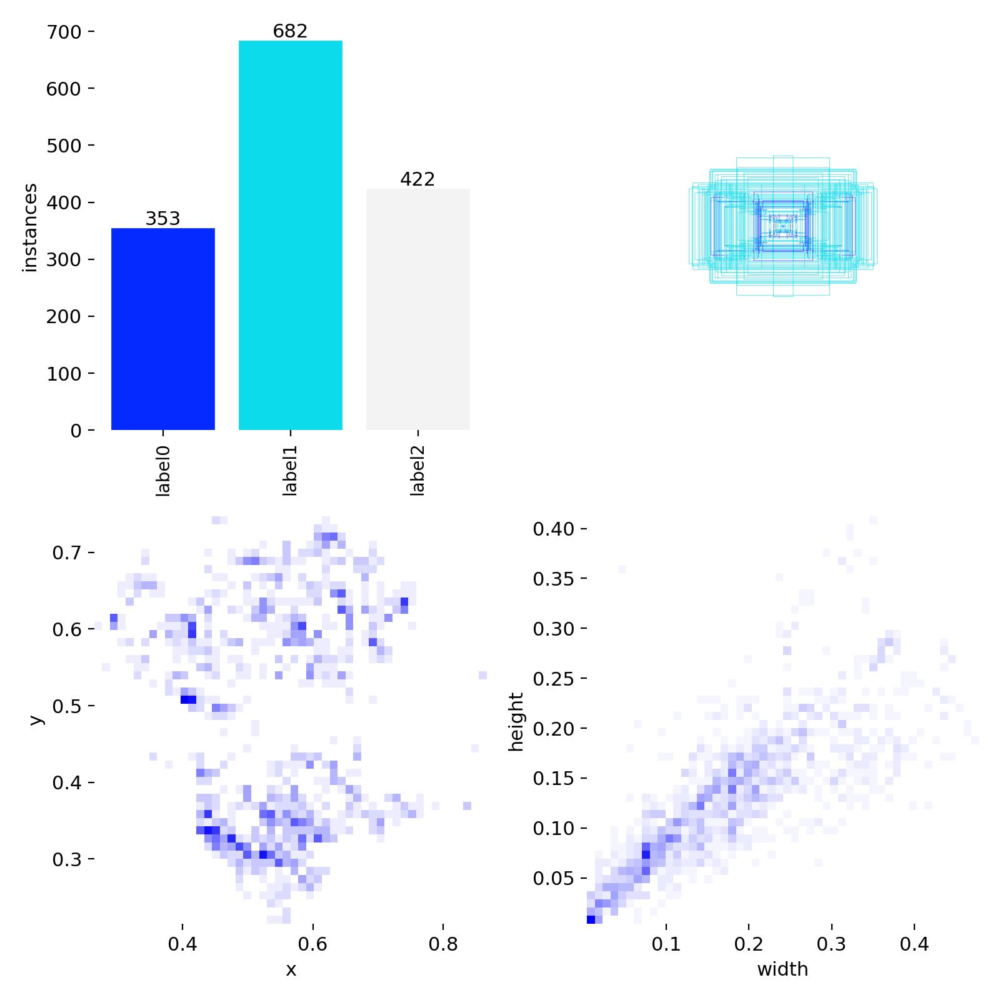

**results.png**

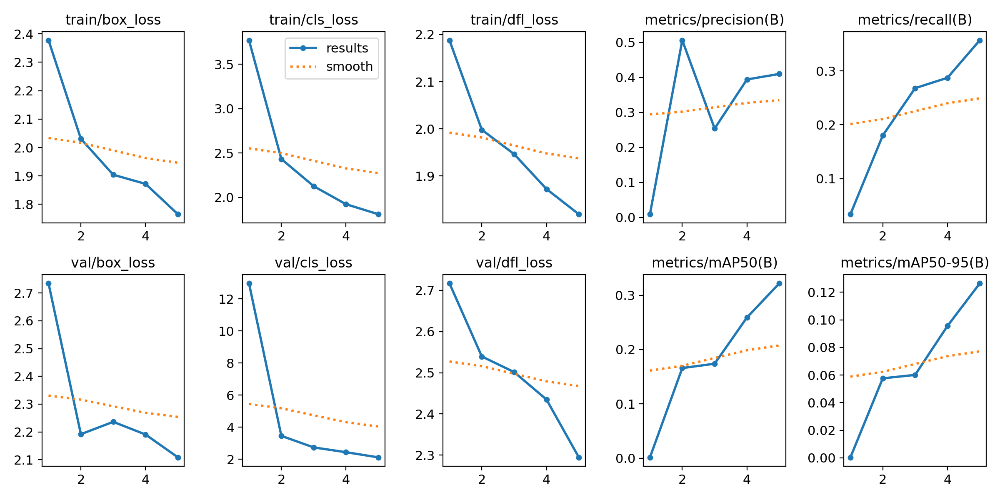

**train_batch0.jpg**

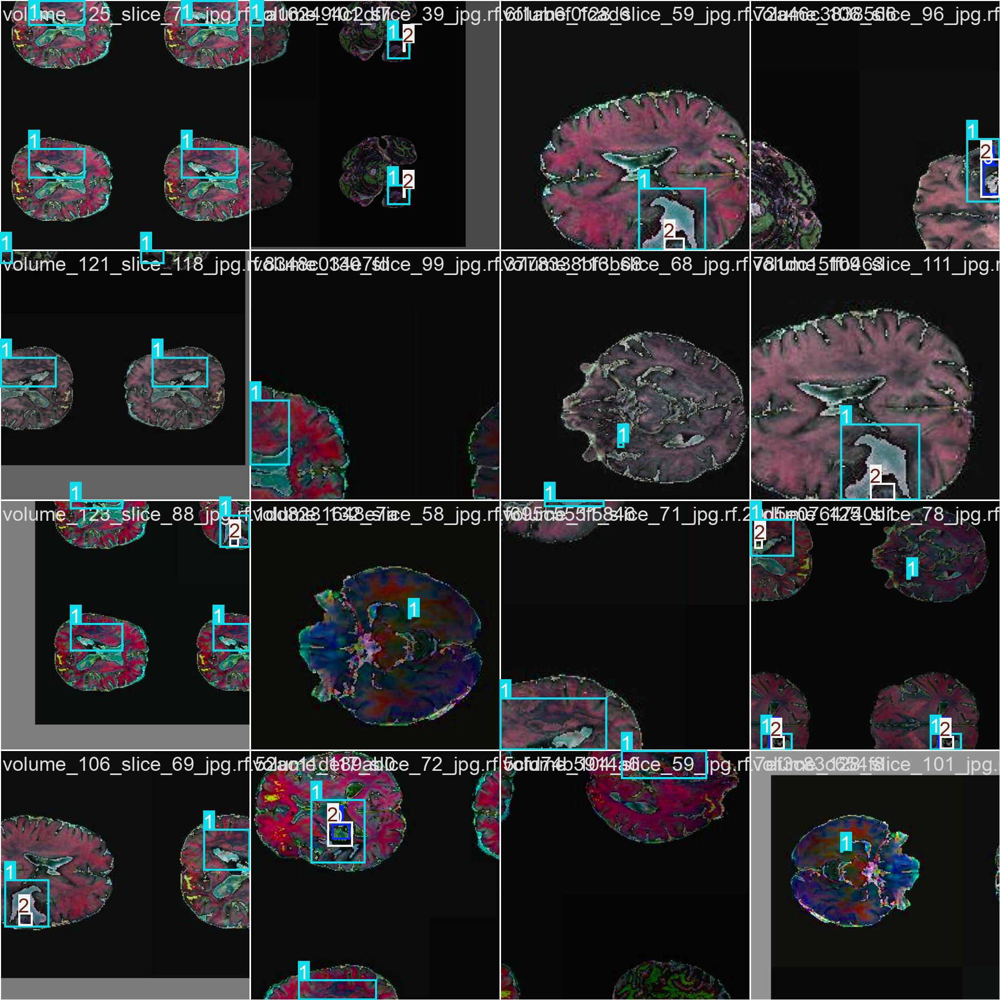

**train_batch1.jpg**

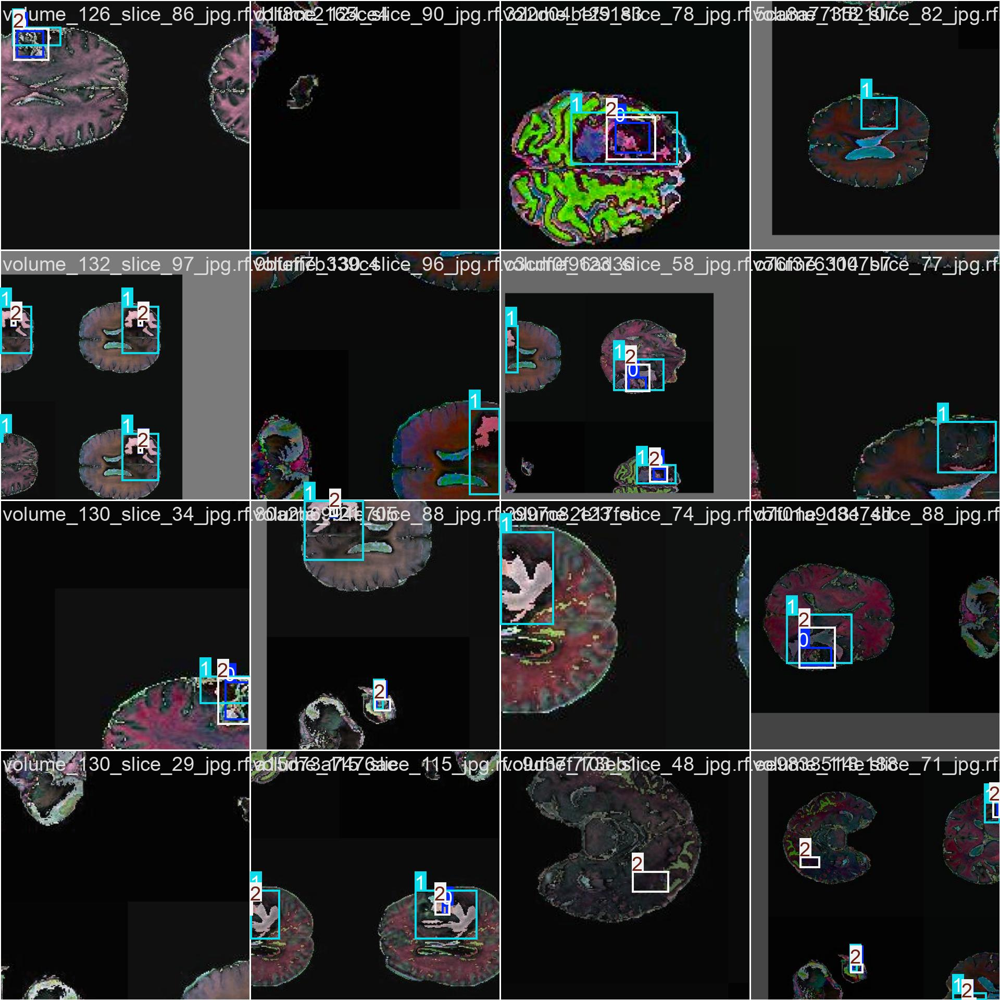

**train_batch2.jpg**

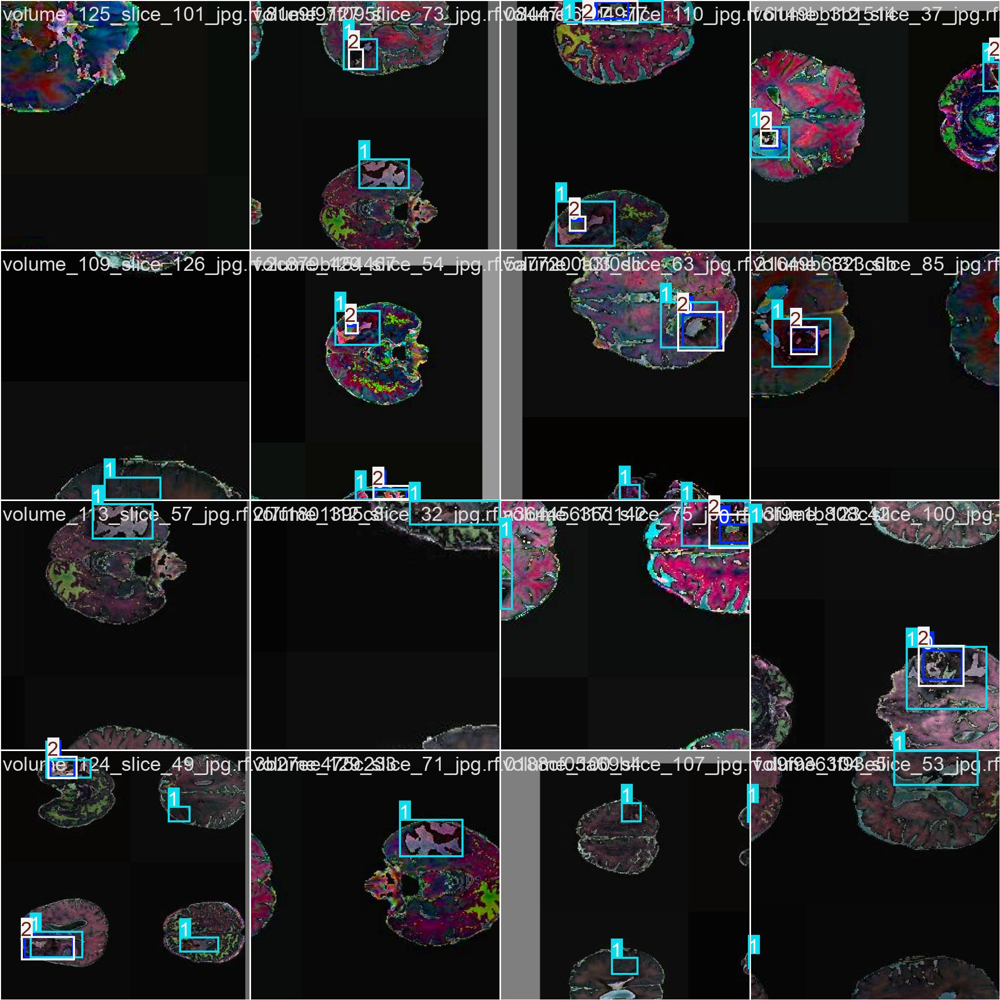

**val_batch0_labels.jpg**

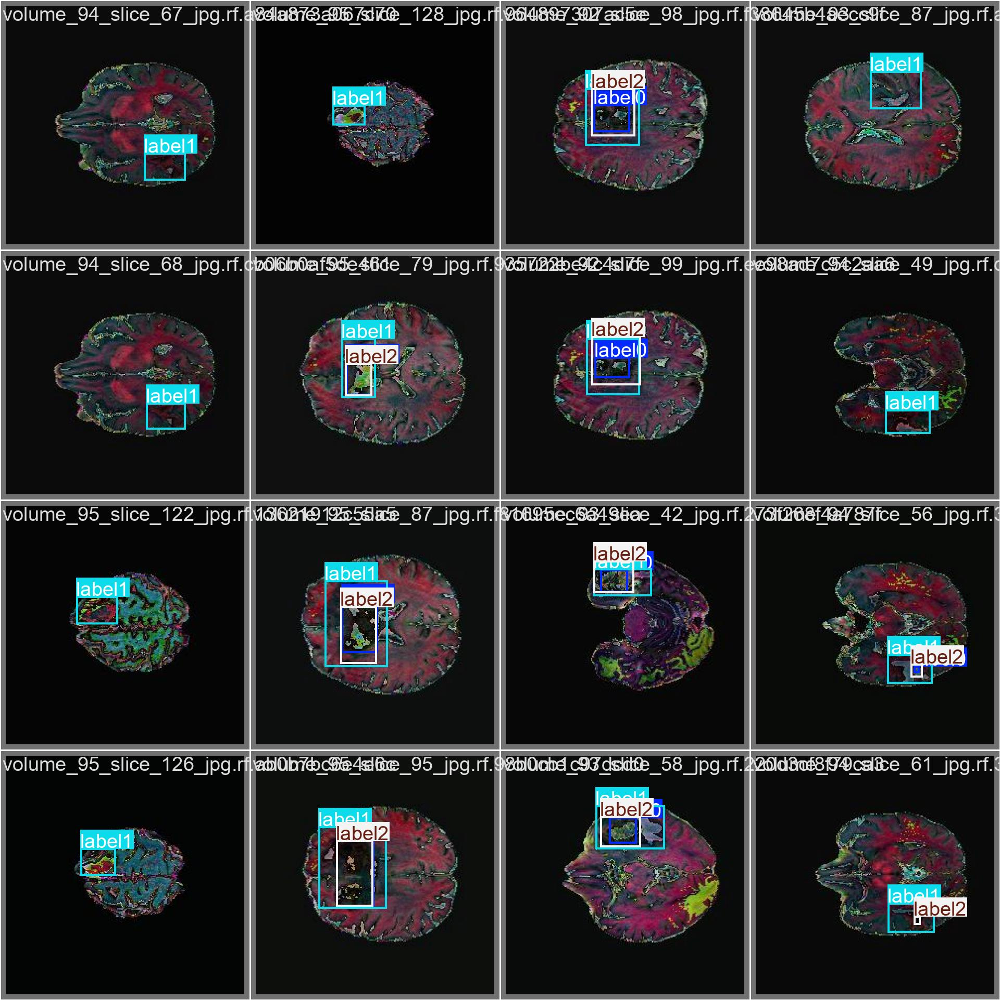

**val_batch0_pred.jpg**

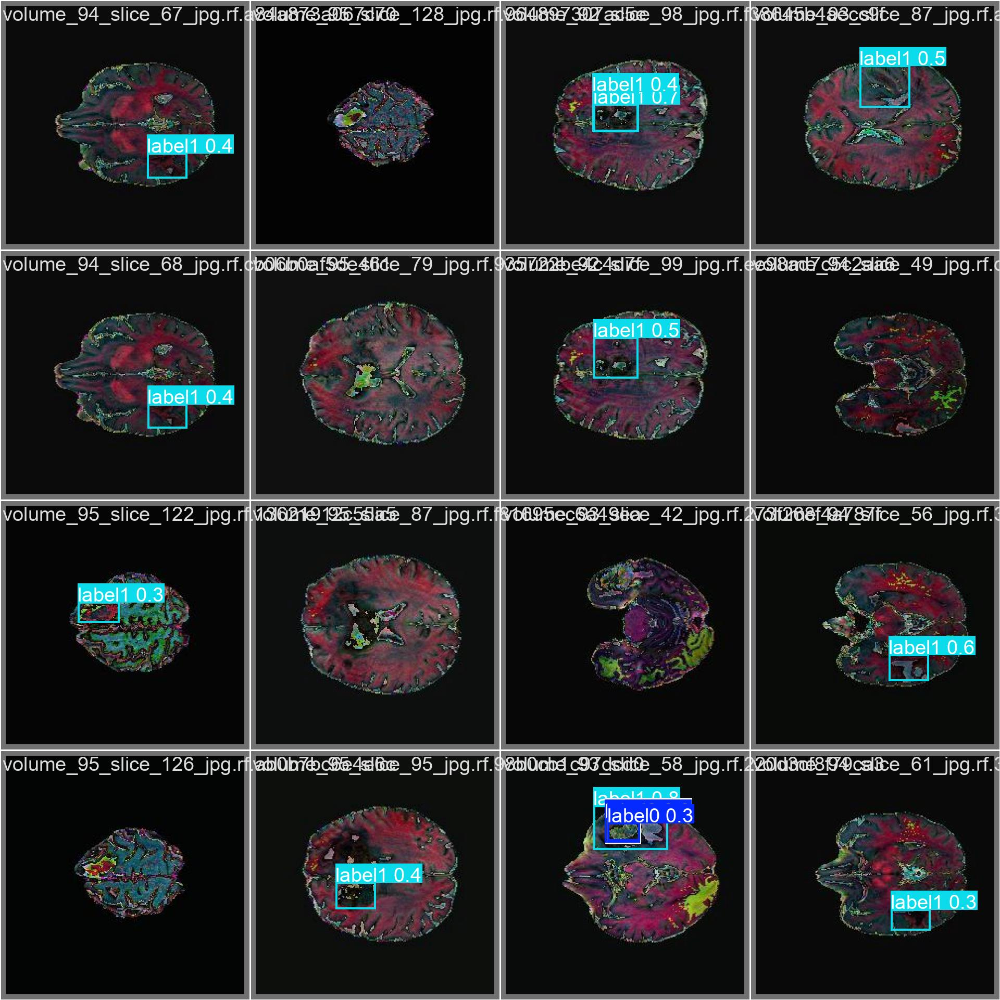

**val_batch1_labels.jpg**

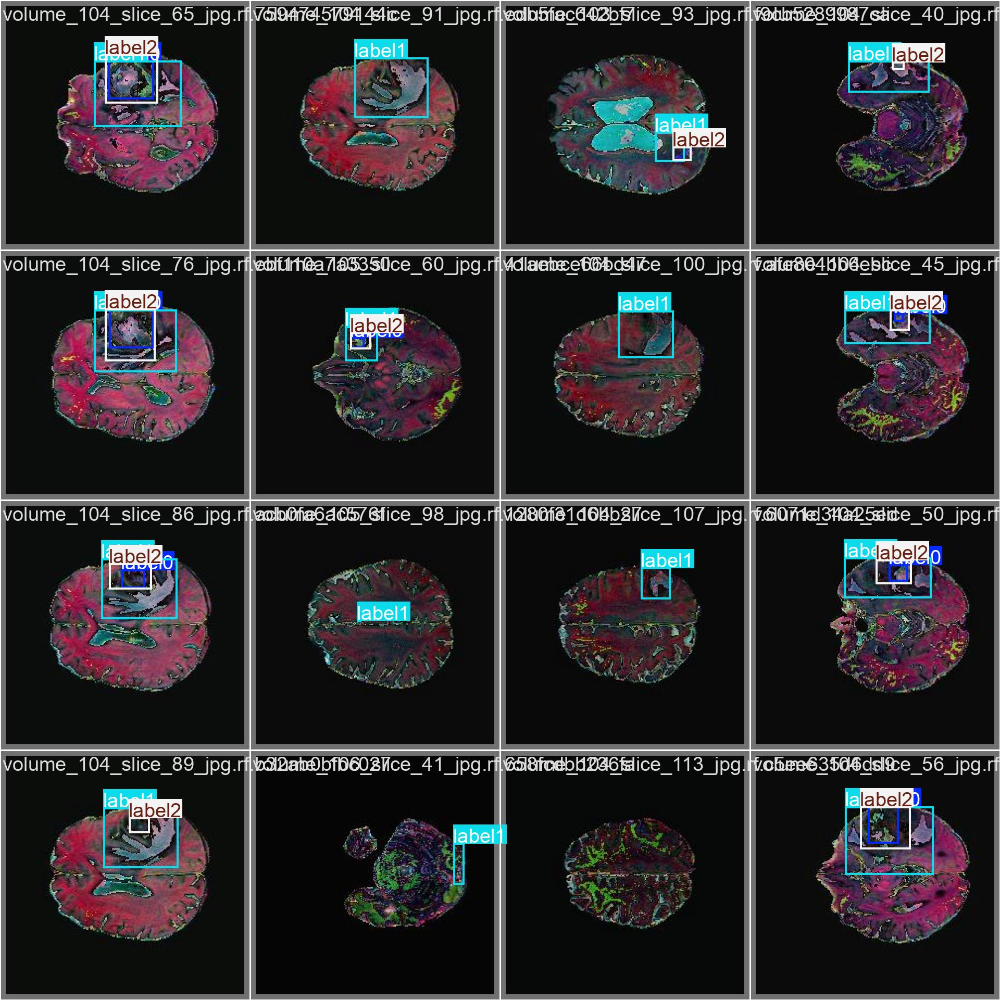

**val_batch1_pred.jpg**

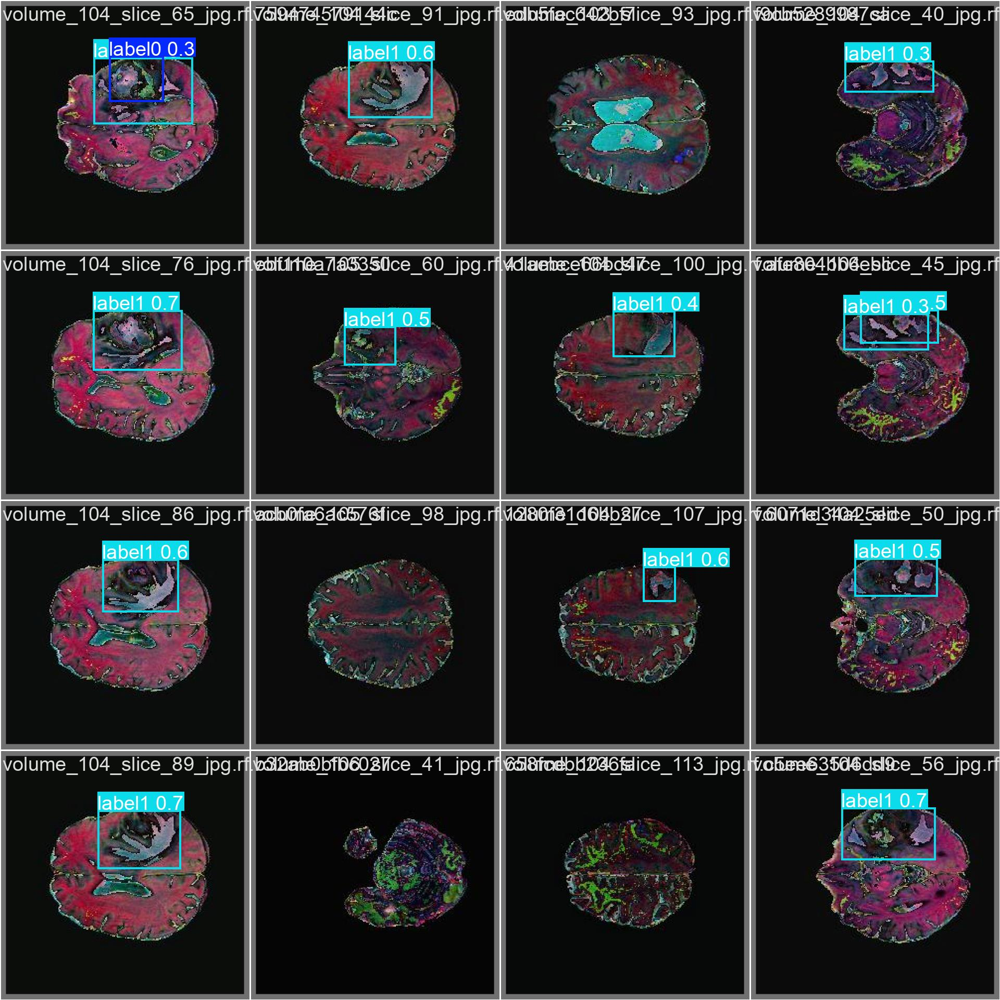

**val_batch2_labels.jpg**

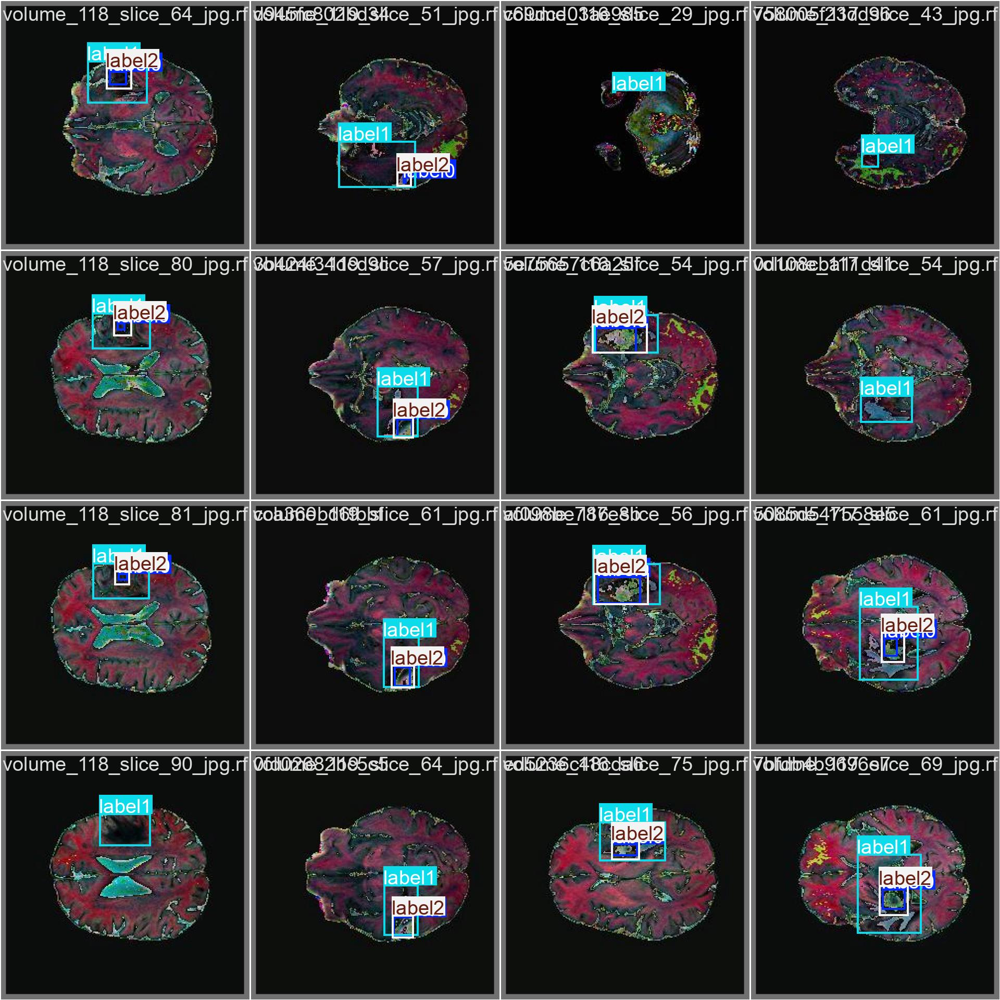

**val_batch2_pred.jpg**

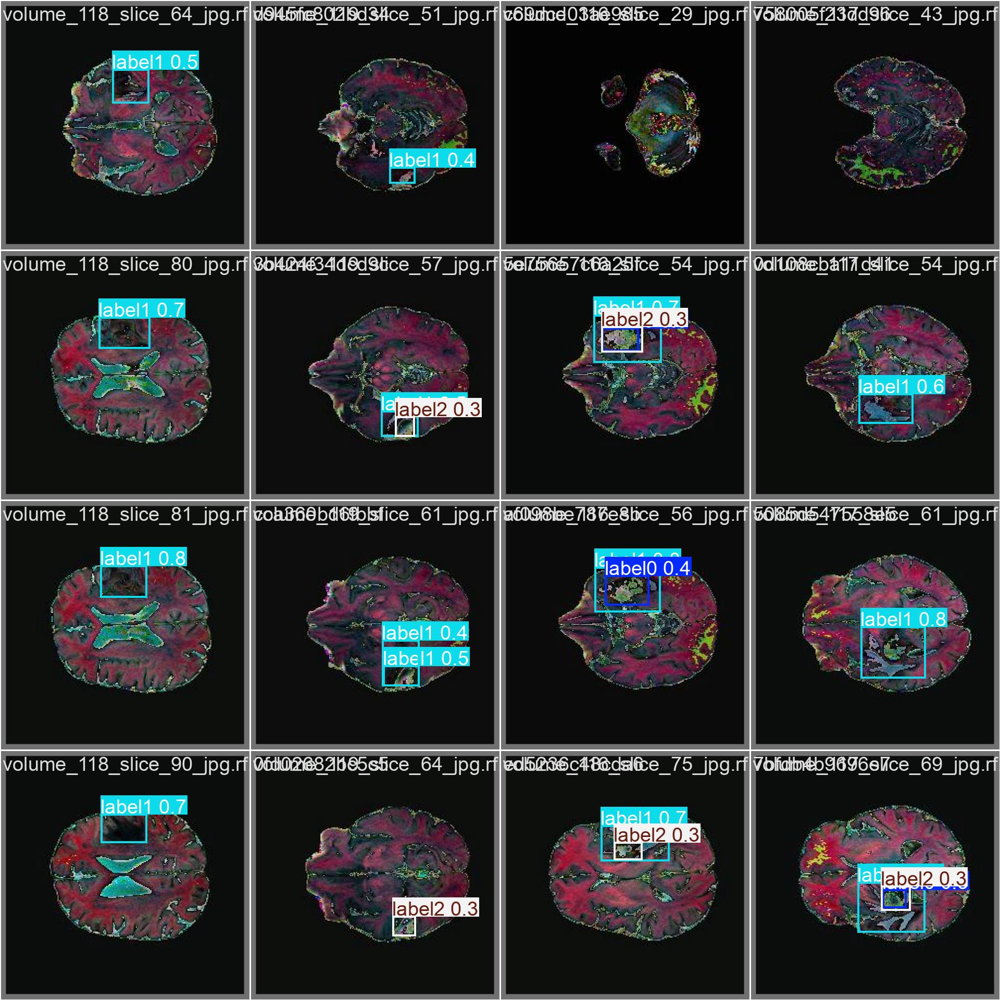

In [13]:
from IPython.display import Image as IPImage, display, Markdown
import glob
import os

# Corrected path to the base directory where YOLOv8 saves its runs
runs_base_dir = 'runs/detect/brain_tumor_project'

run_dirs = sorted(
    [d for d in glob.glob(os.path.join(runs_base_dir, 'yolov8_brain_tumor*')) if os.path.isdir(d)]
)

if run_dirs:
    latest_run = run_dirs[-1]
    print(f"Loading results from: {latest_run}")
    plot_files = sorted(glob.glob(os.path.join(latest_run, '*.png')) + glob.glob(os.path.join(latest_run, '*.jpg')))
    for plot_file in plot_files:
        display(Markdown(f"**{os.path.basename(plot_file)}**"))
        display(IPImage(filename=plot_file, width=800))
else:
    print("No training run directory found. Run Phase 7 first.")

## Phase 10 — Run Inference on Test MRI

Replace the path below with any MRI image you want to run inference on.


In [14]:
# Replace with the path to your test MRI image
test_image_path = '/content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/image_0001.jpg'

results = model.predict(
    source=test_image_path,
    conf=0.25,
    save=True
)

# Display result
from IPython.display import Image as IPImage, display
import glob
import os

if results and hasattr(results[0], 'save_dir'):
    predicted_images = glob.glob(os.path.join(results[0].save_dir, '*.jpg')) + \
                       glob.glob(os.path.join(results[0].save_dir, '*.png'))
    for img_path in sorted(predicted_images):
        display(IPImage(filename=img_path, width=600))
else:
    print("Prediction complete. Check the 'runs/detect/predict' folder for output images.")

FileNotFoundError: /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/image_0001.jpg does not exist

In [15]:
import os

image_dir = '/content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images'

if os.path.exists(image_dir):
    print(f"Files in {image_dir}:")
    for filename in os.listdir(image_dir):
        if filename.endswith(('.jpg', '.jpeg', '.png')):
            print(f"- {filename}")
else:
    print(f"Error: Directory {image_dir} does not exist.")

Files in /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images:
- volume_282_slice_42_jpg.rf.013881a98d9b270442d1330f22377e9d.jpg
- volume_273_slice_110_jpg.rf.02b1754d100aa0fde85a28ba32d5c433.jpg
- volume_75_slice_96_jpg.rf.159cca93701cc17b7cd2795b726fd70d.jpg
- volume_269_slice_83_jpg.rf.0832607f768fb445ae59dcc42468b16f.jpg
- volume_59_slice_44_jpg.rf.196da0edafcbaf54b8bc6e45502729d1.jpg
- volume_232_slice_85_jpg.rf.087dc58b852b9f7fab153b58e5080d39.jpg
- volume_29_slice_59_jpg.rf.025f315e7e777c54b71038c8aee993a4.jpg
- volume_258_slice_113_jpg.rf.0b469c21aa7d2b6fd5dbdd69c93fe691.jpg
- volume_29_slice_62_jpg.rf.190381d3263aeb3b012ba64193567c2c.jpg
- volume_306_slice_56_jpg.rf.16a16e9745b674ba61c96d0333c306a5.jpg
- volume_235_slice_116_jpg.rf.0f4527210630081fbfa0ec6b37a5e1d7.jpg
- volume_45_slice_62_jpg.rf.1264111430397e258919ffec29845fd2.jpg
- volume_85_slice_111_jpg.rf.169556512219c7922b604688893a7fe0.jpg
- volume_71_slice_76_jpg.rf.12821bca70703e1f2e26

## Phase 11 — Export to ONNX

Exports the fine-tuned model to ONNX format for deployment in production environments.


In [16]:
model.export(format="onnx")


Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/runs/detect/brain_tumor_project/yolov8_brain_tumor/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (21.5 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 12 packages in 265ms
Prepared 4 packages in 12.56s
Installed 4 packages in 282ms
 + colorama==0.4.6
 + onnx==1.21.0
 + onnxruntime-gpu==1.26.0
 + onnxslim==0.1.93

requirements: AutoUpdate success ✅ 13.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.21.0 opset 20...
ONNX: slimming with onnxslim 0.1.93...
ONNX: export succ

'/content/runs/detect/brain_tumor_project/yolov8_brain_tumor/weights/best.onnx'

Attempting to load fine-tuned model from: runs/detect/brain_tumor_project/yolov8_brain_tumor/weights/best.pt
Fine-tuned model (best.pt) loaded successfully!

Running inference on 5 selected test images...

--- Image 1/5: volume_253_slice_91_jpg.rf.436f00f61de990842351c78cedb081d6.jpg ---

image 1/1 /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/volume_253_slice_91_jpg.rf.436f00f61de990842351c78cedb081d6.jpg: 640x640 1 label1, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/inference_with_best_model-2


**Original Test Image (volume_253_slice_91_jpg.rf.436f00f61de990842351c78cedb081d6.jpg):**

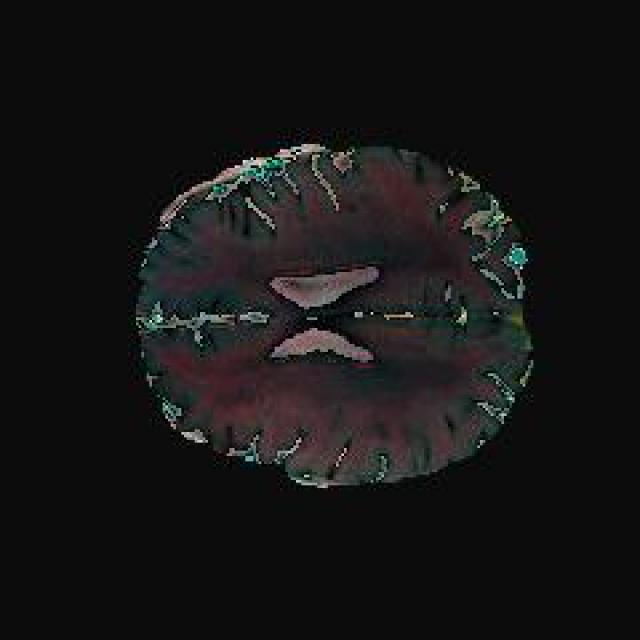

**Detected Tumors (using best.pt):**

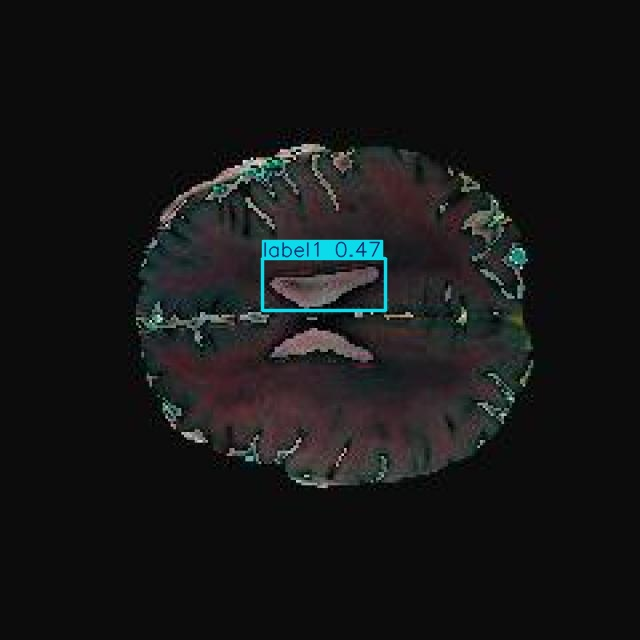


--- Image 2/5: volume_45_slice_78_jpg.rf.ef91abba8af7ec17043eb9ebd489aa8f.jpg ---

image 1/1 /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/volume_45_slice_78_jpg.rf.ef91abba8af7ec17043eb9ebd489aa8f.jpg: 640x640 1 label1, 16.3ms
Speed: 2.1ms preprocess, 16.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/inference_with_best_model-3


**Original Test Image (volume_45_slice_78_jpg.rf.ef91abba8af7ec17043eb9ebd489aa8f.jpg):**

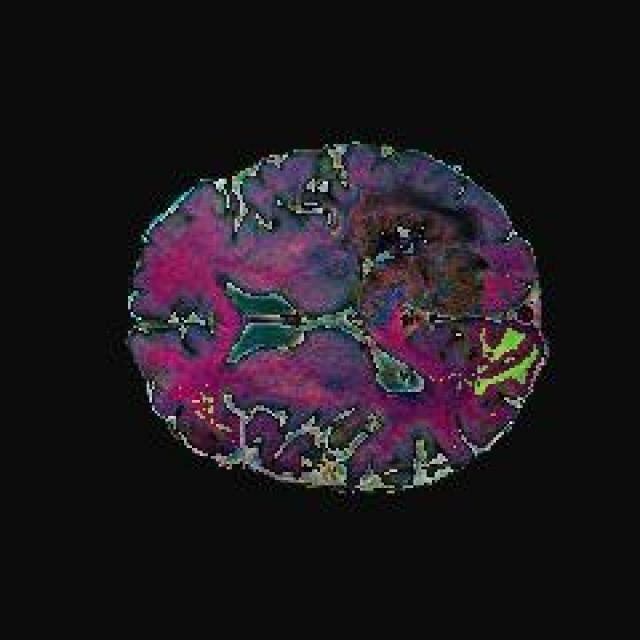

**Detected Tumors (using best.pt):**

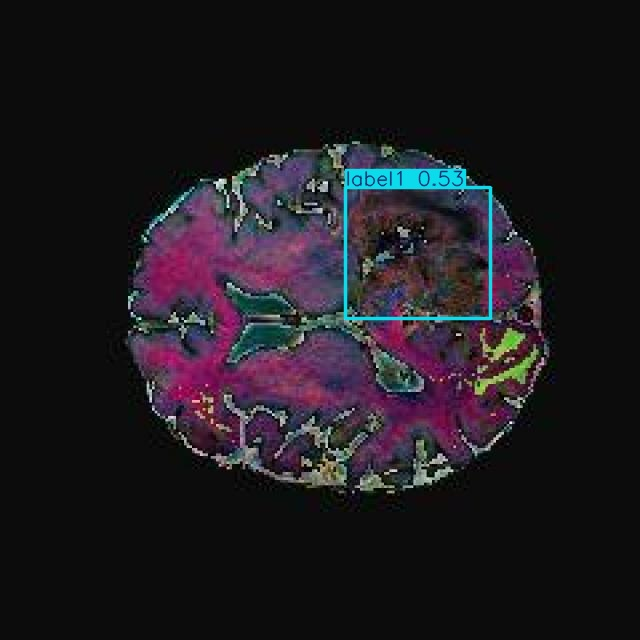


--- Image 3/5: volume_215_slice_56_jpg.rf.2d2ba40483ae021f52facc5cdd9e7b83.jpg ---

image 1/1 /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/volume_215_slice_56_jpg.rf.2d2ba40483ae021f52facc5cdd9e7b83.jpg: 640x640 1 label1, 16.2ms
Speed: 1.8ms preprocess, 16.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/inference_with_best_model-4


**Original Test Image (volume_215_slice_56_jpg.rf.2d2ba40483ae021f52facc5cdd9e7b83.jpg):**

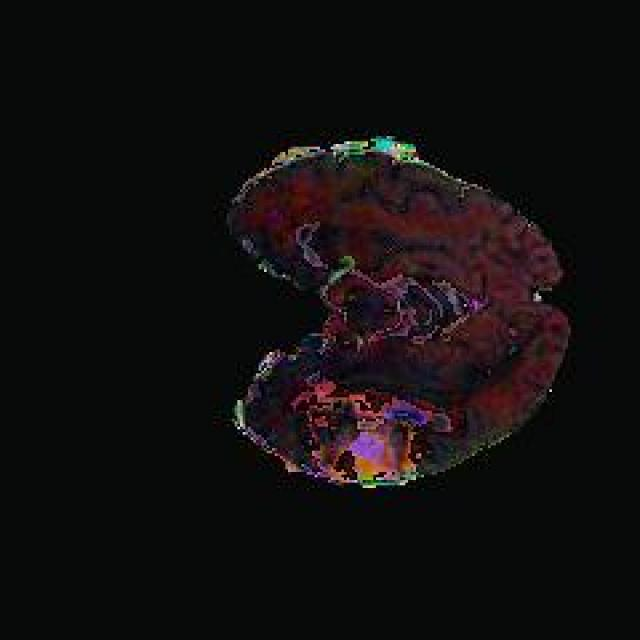

**Detected Tumors (using best.pt):**

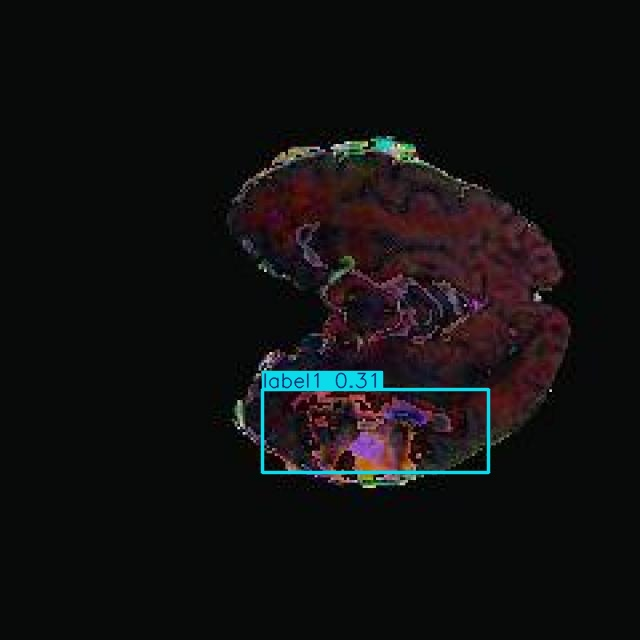


--- Image 4/5: volume_289_slice_89_jpg.rf.41c565521c48af0d1f81c731f5f4b431.jpg ---

image 1/1 /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/volume_289_slice_89_jpg.rf.41c565521c48af0d1f81c731f5f4b431.jpg: 640x640 1 label1, 16.2ms
Speed: 1.8ms preprocess, 16.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/inference_with_best_model-5


**Original Test Image (volume_289_slice_89_jpg.rf.41c565521c48af0d1f81c731f5f4b431.jpg):**

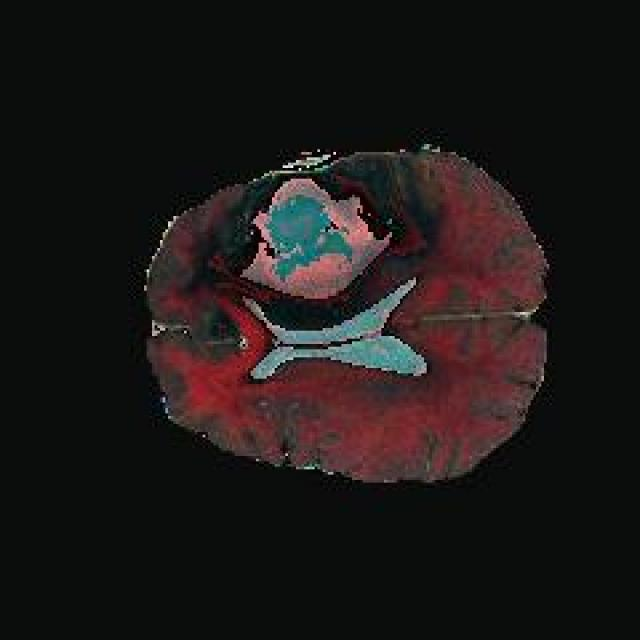

**Detected Tumors (using best.pt):**

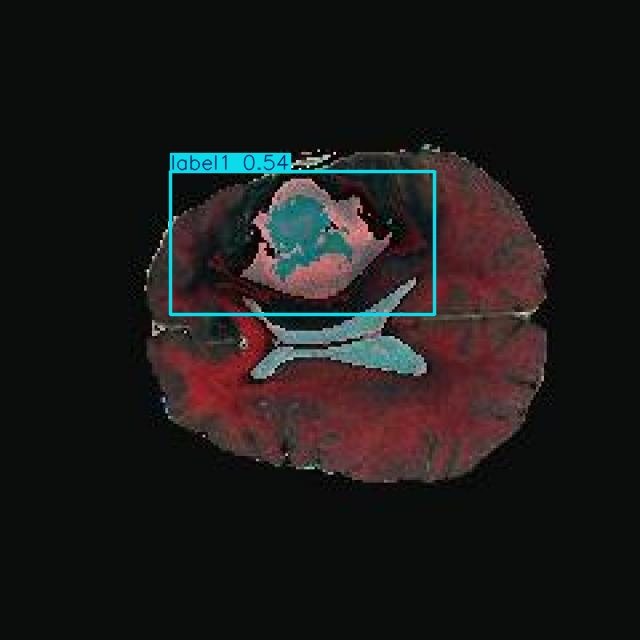


--- Image 5/5: volume_22_slice_65_jpg.rf.5c329c78509f9ba7c94726f2ff181ba8.jpg ---

image 1/1 /content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images/volume_22_slice_65_jpg.rf.5c329c78509f9ba7c94726f2ff181ba8.jpg: 640x640 (no detections), 16.2ms
Speed: 1.9ms preprocess, 16.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/inference_with_best_model-6


**Original Test Image (volume_22_slice_65_jpg.rf.5c329c78509f9ba7c94726f2ff181ba8.jpg):**

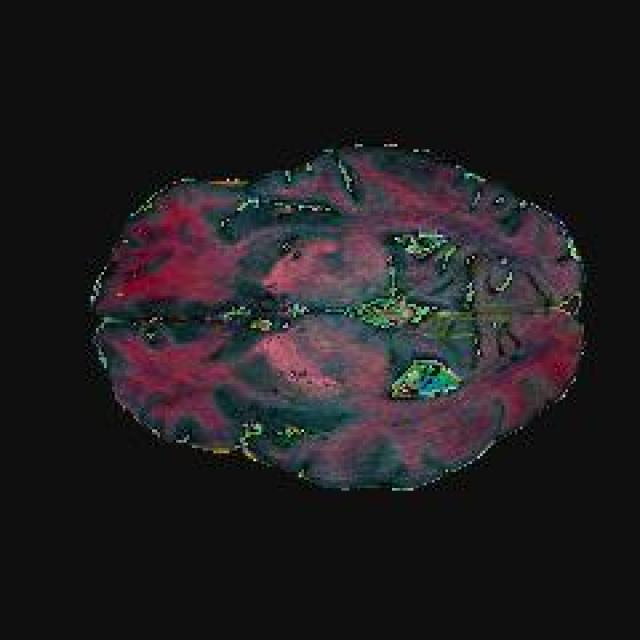

**Detected Tumors (using best.pt):**

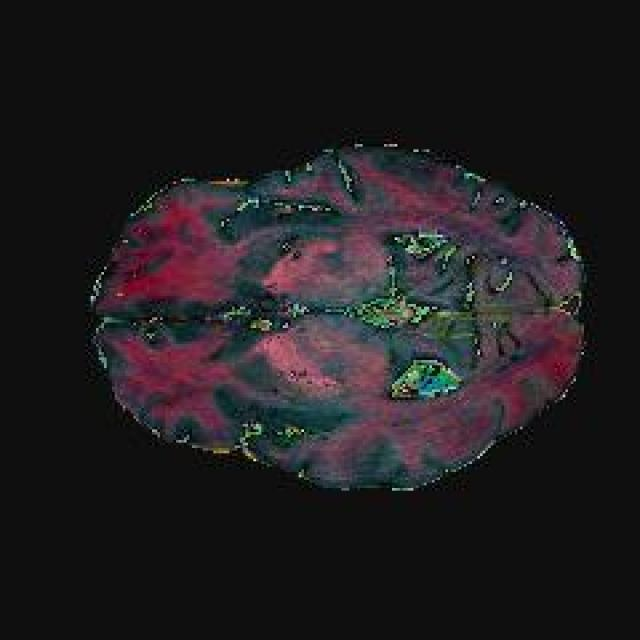

In [20]:
import os
from ultralytics import YOLO
from IPython.display import Image as IPImage, display, Markdown
import glob
import random

# --- 1. Load the Fine-Tuned Model ---
# Ensure 'latest_run' is defined to point to your training run directory
# This assumes Phase 9 (Visualize Training Results) has been run successfully
runs_base_dir = 'runs/detect/brain_tumor_project'
run_dirs = sorted(
    [d for d in glob.glob(os.path.join(runs_base_dir, 'yolov8_brain_tumor*')) if os.path.isdir(d)]
)

fine_tuned_model = None
if run_dirs:
    latest_run = run_dirs[-1]
    weights_path = os.path.join(latest_run, 'weights', 'best.pt')
    print(f"Attempting to load fine-tuned model from: {weights_path}")
    if os.path.exists(weights_path):
        fine_tuned_model = YOLO(weights_path)
        print("Fine-tuned model (best.pt) loaded successfully!")
    else:
        print(f"Error: Weights file not found at {weights_path}. Please ensure training completed successfully and try again.")
else:
    print("Error: No training run directory found. Please ensure Phase 7 (Fine-Tune) and Phase 9 (Visualize) have been run.")


# --- 2. Run Inference on Multiple Test Images (if model loaded) ---
if fine_tuned_model:
    # Define the directory containing test images
    test_image_dir = '/content/drive/MyDrive/Brain Tumor Detection/unzipped_brain_tumor_dataset/test/images'

    # Get a list of all image files in the test directory
    all_test_images = [f for f in os.listdir(test_image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Select at least 5 random images, or all if less than 5 are available
    num_images_to_test = min(5, len(all_test_images))
    if num_images_to_test == 0:
        print(f"Error: No image files found in {test_image_dir}.")
    else:
        selected_test_image_filenames = random.sample(all_test_images, num_images_to_test)

        print(f"\nRunning inference on {num_images_to_test} selected test images...")
        for i, selected_filename in enumerate(selected_test_image_filenames):
            test_image_path = os.path.join(test_image_dir, selected_filename)

            if os.path.exists(test_image_path):
                print(f"\n--- Image {i+1}/{num_images_to_test}: {selected_filename} ---")
                # Set save=True to save the image with detections in a 'predict' folder within the run directory
                inference_results = fine_tuned_model.predict(
                    source=test_image_path,
                    conf=0.25, # Confidence threshold for detections
                    save=True,
                    name='inference_with_best_model' # Custom name for this prediction run
                )

                # --- 3. Display the Results for each image ---
                if inference_results and hasattr(inference_results[0], 'save_dir'):
                    predicted_image_save_dir = inference_results[0].save_dir
                    predicted_image_path = os.path.join(predicted_image_save_dir, selected_filename)

                    if os.path.exists(predicted_image_path):
                        display(Markdown(f"**Original Test Image ({selected_filename}):**"))
                        display(IPImage(filename=test_image_path, width=600))
                        display(Markdown(f"**Detected Tumors (using {os.path.basename(weights_path)}):**"))
                        display(IPImage(filename=predicted_image_path, width=600))
                    else:
                        print(f"Predicted image not found at {predicted_image_path}.")
                else:
                    print("Inference completed, but no detectable objects or save directory found for display.")
            else:
                print(f"Error: Test image not found at {test_image_path}. Skipping this image.")
else:
    print("Cannot run inference because the fine-tuned model could not be loaded.")

### Performance Curves

**Boxpr Curve**

The Precision-Recall (PR) curve is crucial for evaluating object detection models, especially with class imbalance. A larger Area Under the Curve (AUC) signifies superior model performance.

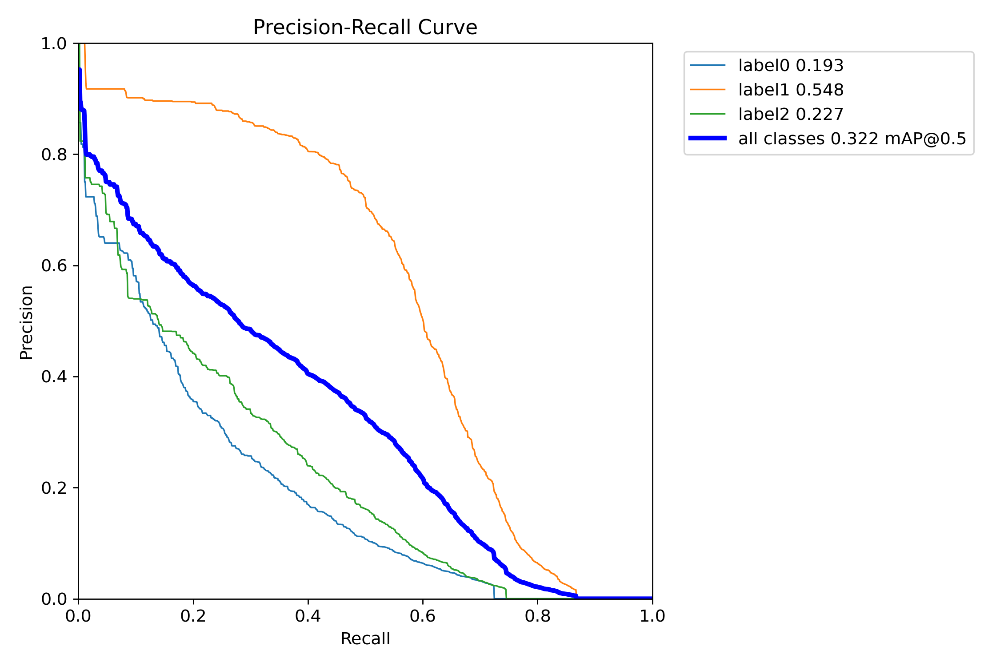

**Boxp Curve**

This graph shows the Precision curve, which represents the accuracy of positive predictions (true positives divided by true positives + false positives) across different confidence thresholds.

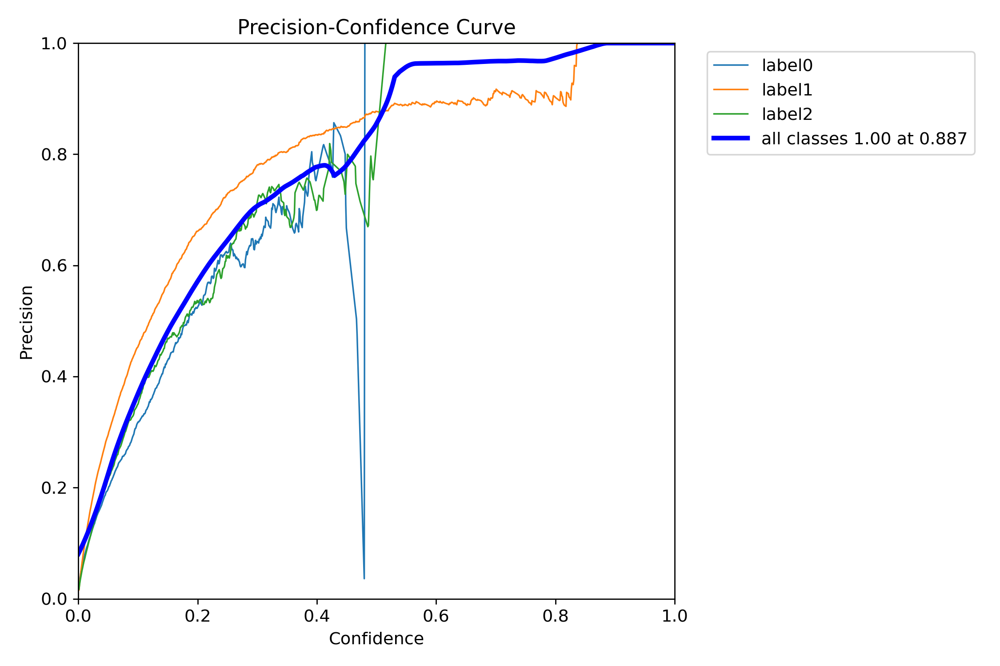

**Boxr Curve**

The Recall curve displays the model's ability to find all relevant instances (true positives divided by true positives + false negatives) at various confidence thresholds.

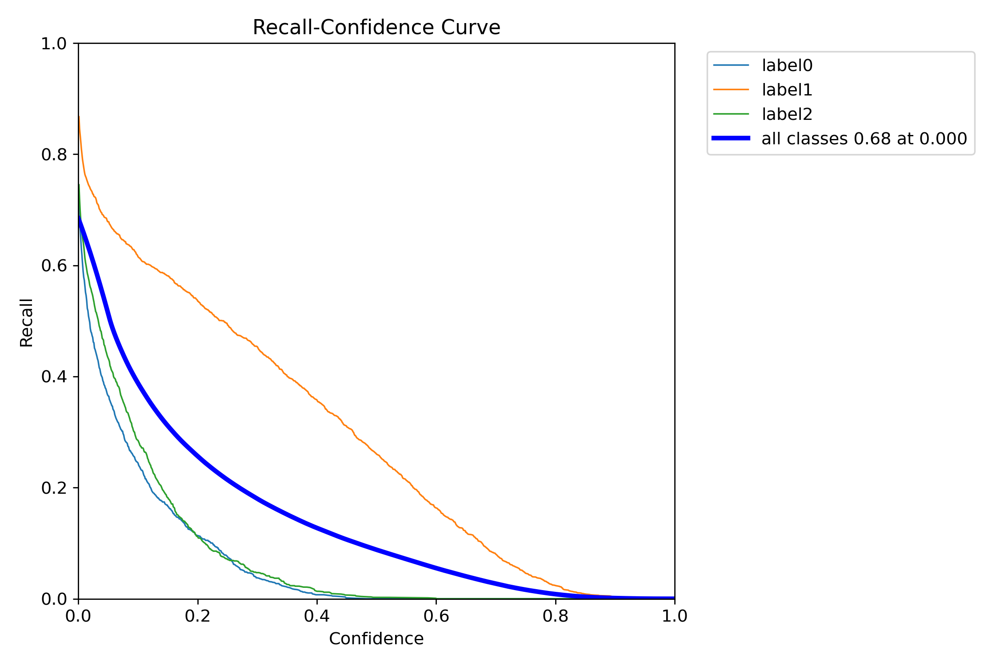

**Boxf1 Curve**

This F1-score curve illustrates the balance between precision and recall for object detection at various confidence thresholds. A higher F1-score indicates better overall detection performance.

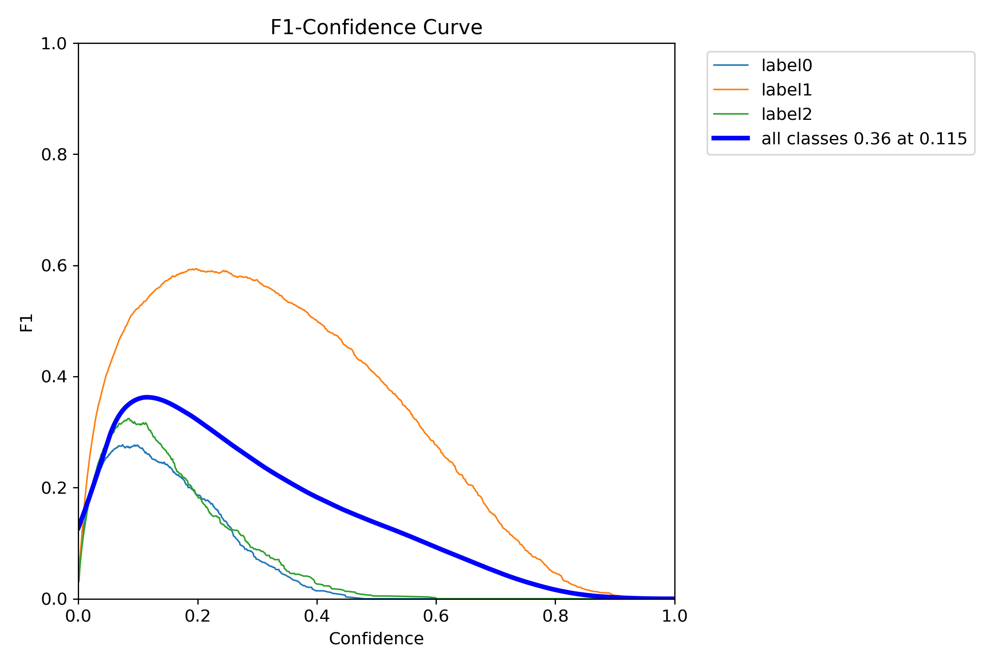

### Confusion Matrices

**Confusion Matrix**

The confusion matrix provides a detailed breakdown of correct and incorrect predictions for each class, helping to identify which categories the model might be confusing.

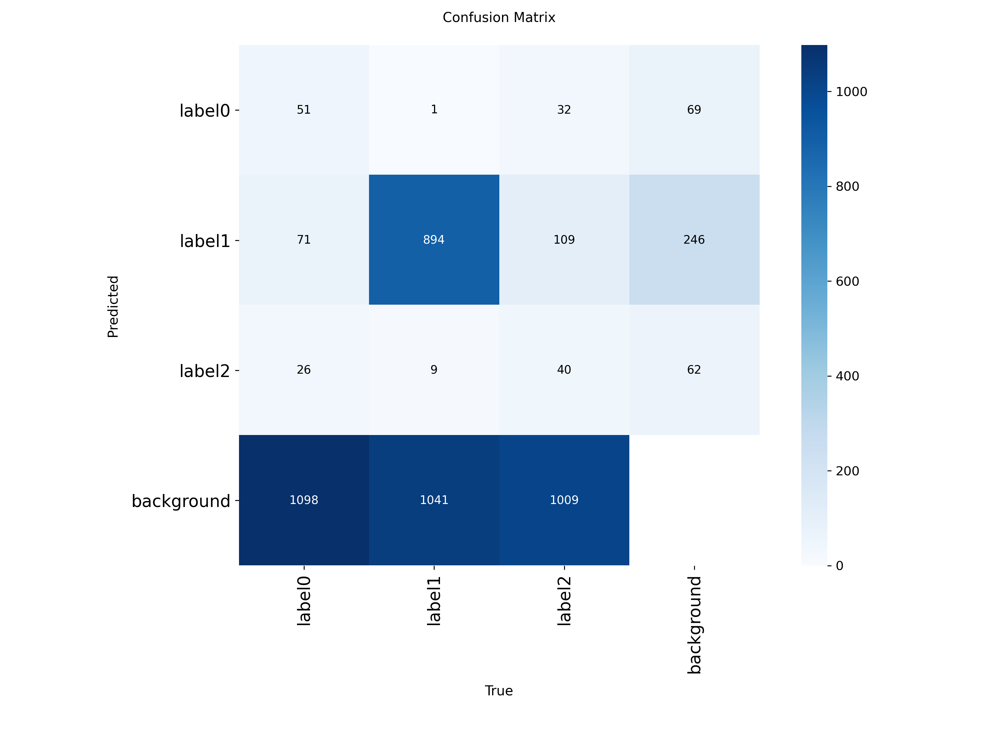

**Confusion Matrix Normalized**

This normalized confusion matrix shows the proportion of predictions, making it easier to compare classification performance across classes, especially when class sizes are uneven.

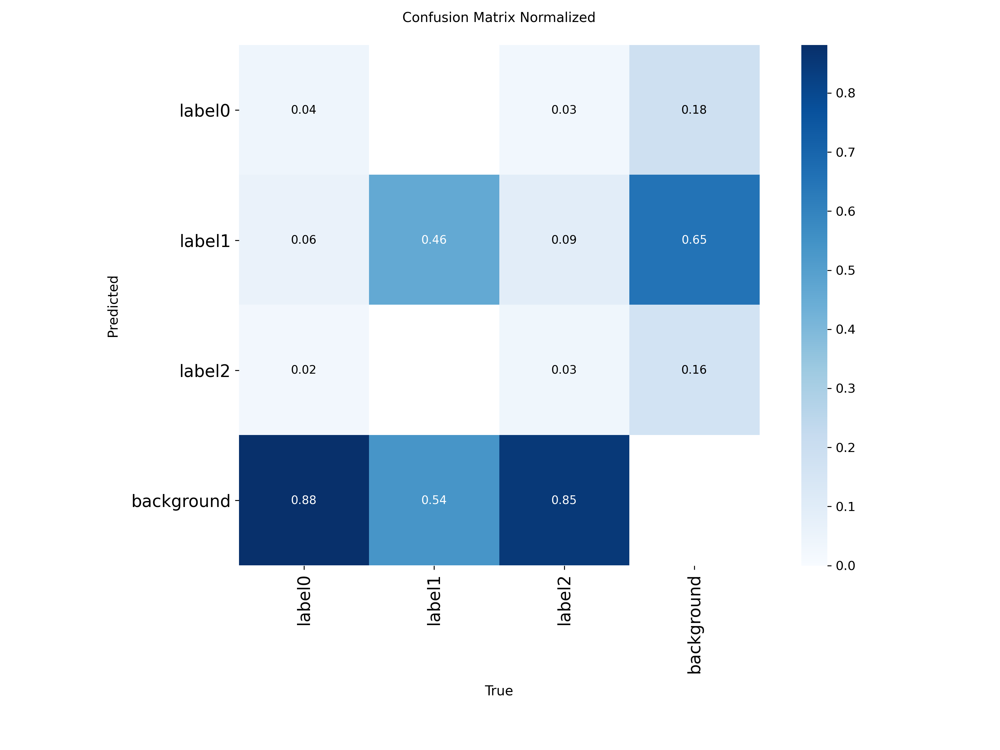

### Label Distributions

**Labels**

This plot visualizes the distribution of object labels (bounding box centers and dimensions) in your dataset, which can help in identifying potential biases or anomalies in the data.

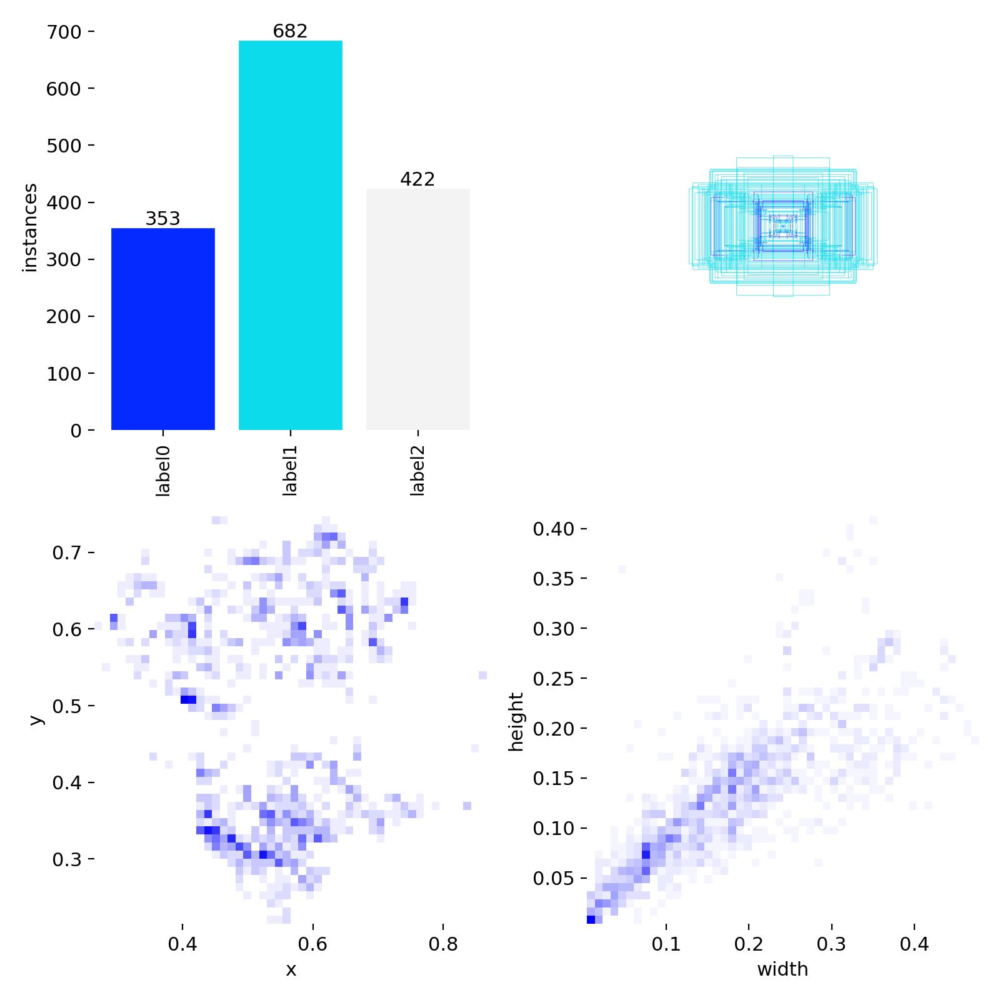

### Overall Results

**Results**

This 'results.png' plot offers a comprehensive overview of the training process, displaying various metrics such as loss (box, object, classification), mAP, precision, and recall over the training epochs.

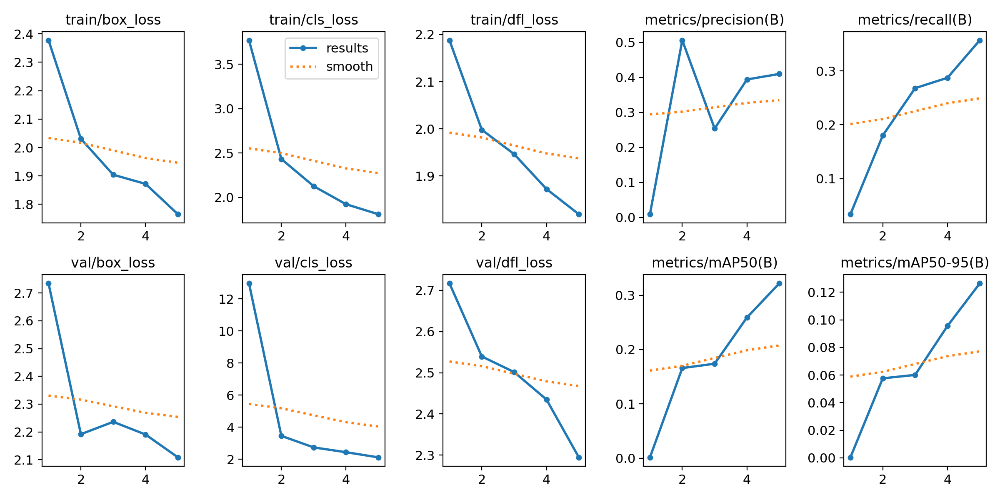

### Training & Validation Batches

**Train Batch0**

This image displays a batch of training images with their ground truth bounding box labels, providing a visual inspection of the data the model was trained on.

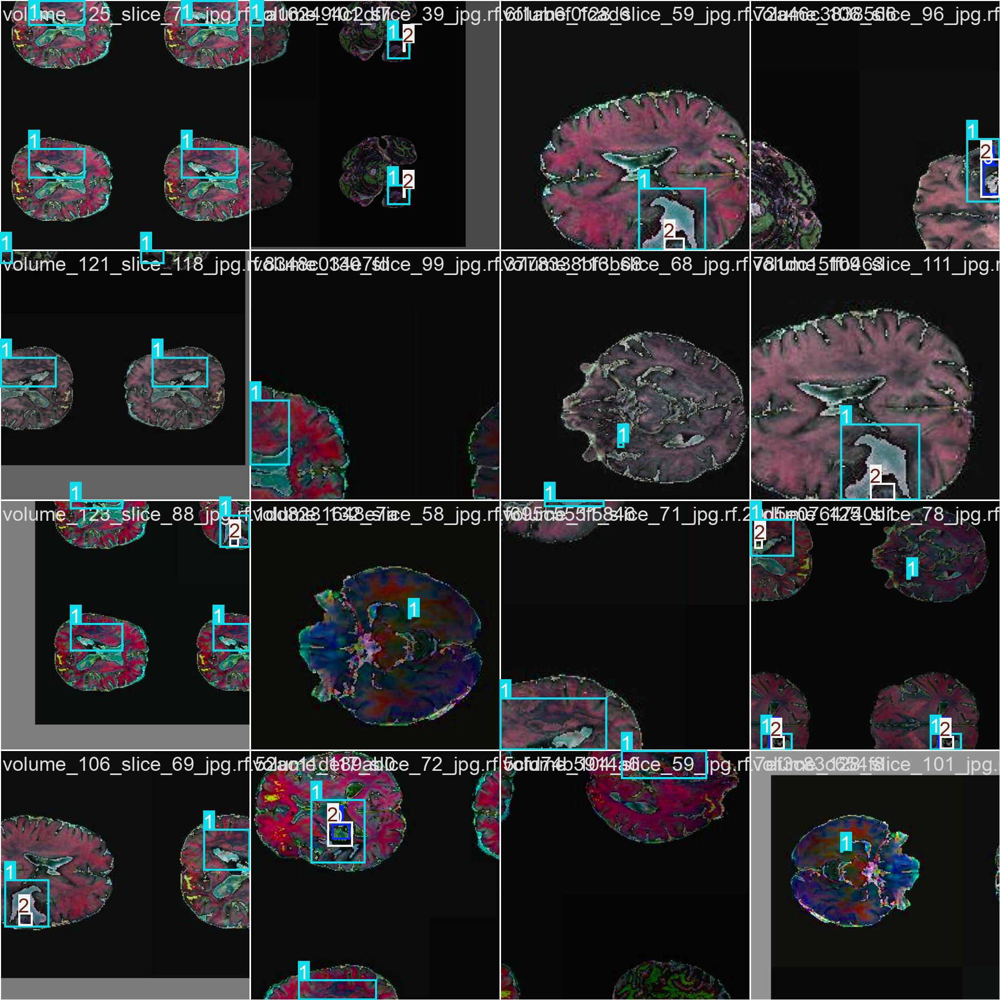

**Train Batch1**

This image displays a batch of training images with their ground truth bounding box labels, providing a visual inspection of the data the model was trained on.

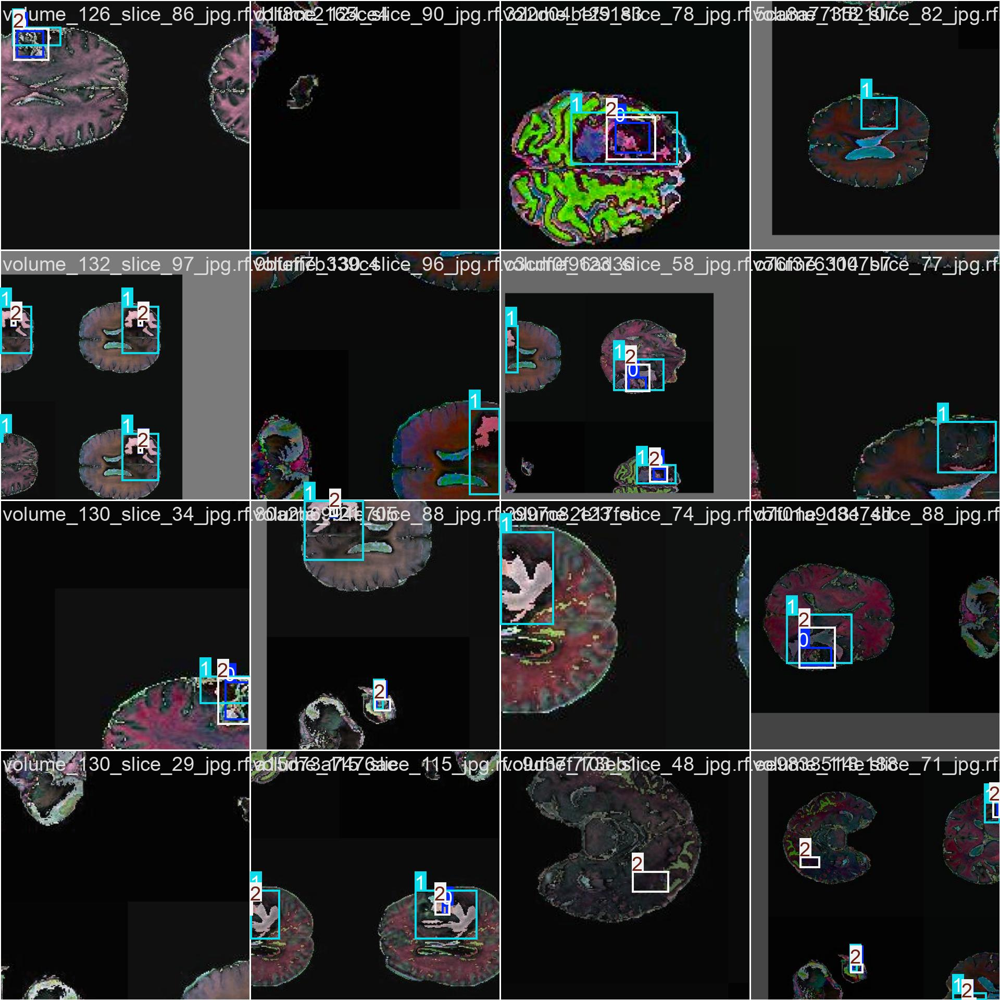

**Train Batch2**

This image displays a batch of training images with their ground truth bounding box labels, providing a visual inspection of the data the model was trained on.

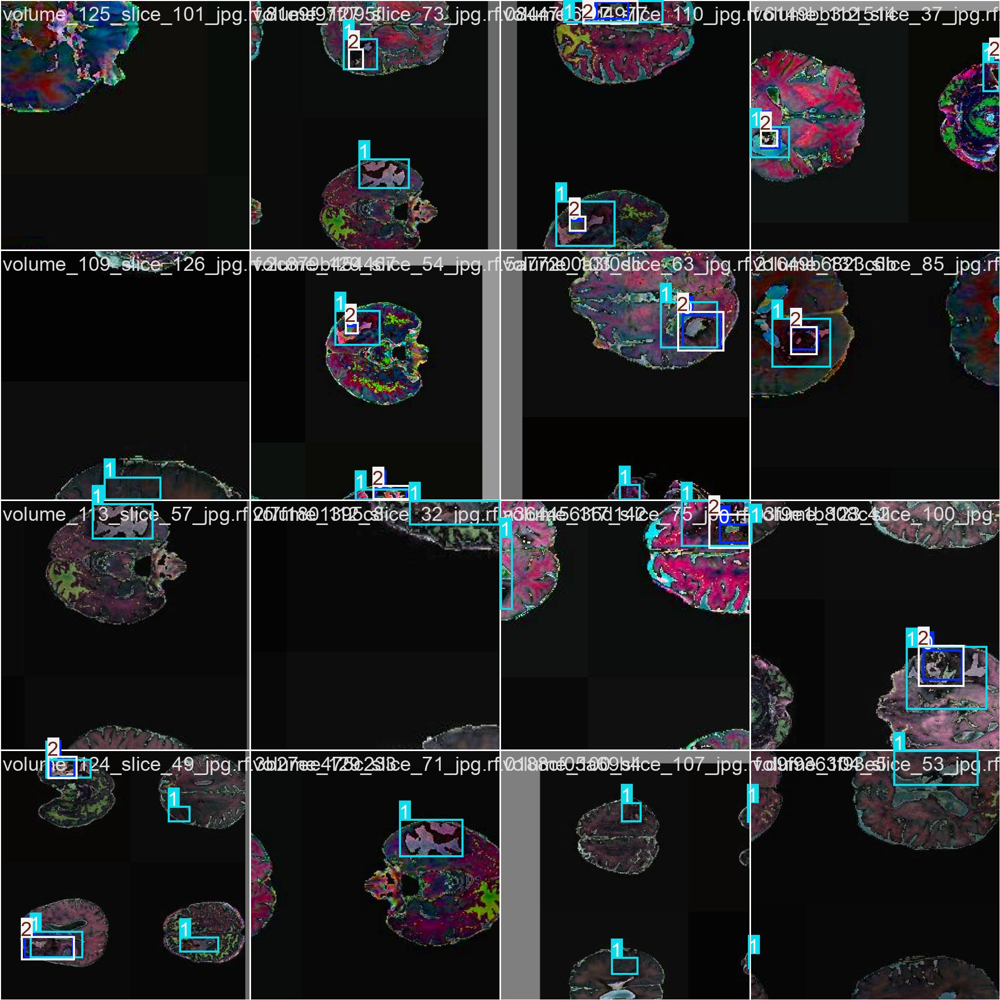

**Val Batch0 Labels**

This image shows a batch of validation images with their ground truth bounding box labels, which can be compared against the model's predictions (e.g., `val_batch0_pred.jpg`).

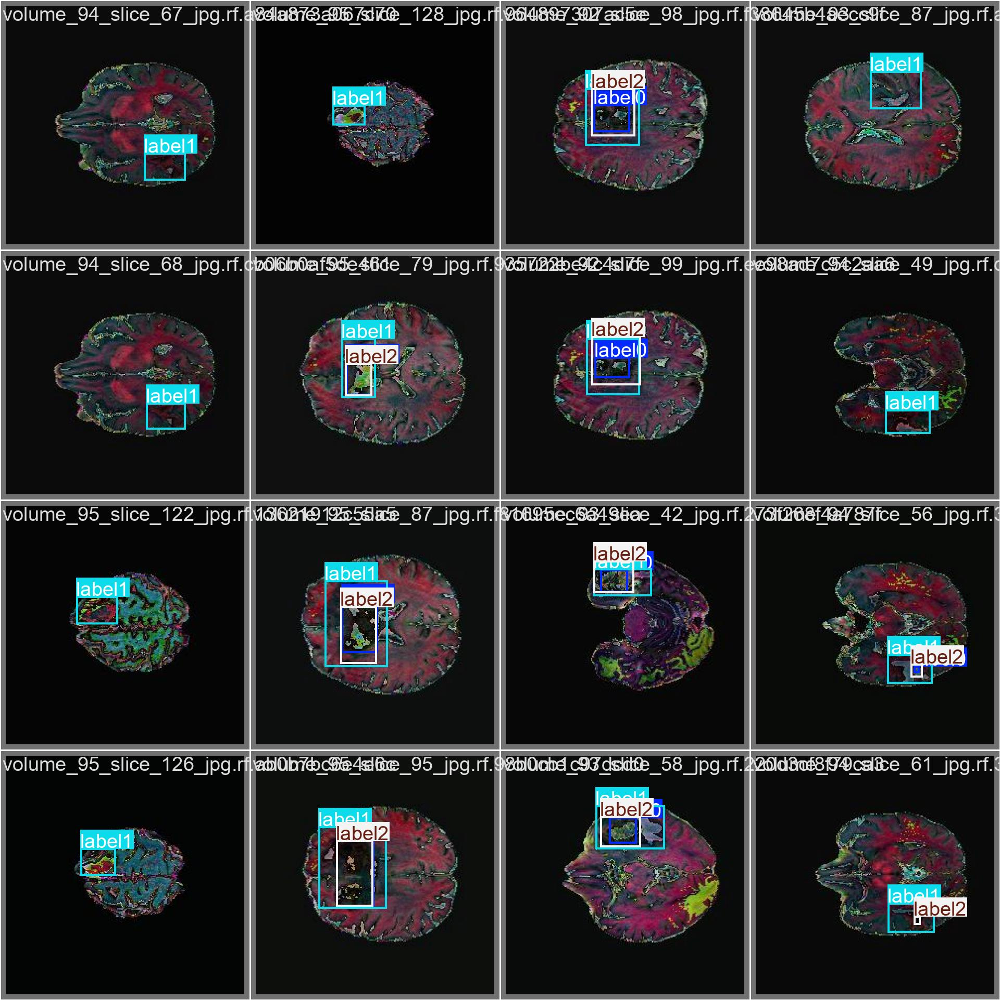

**Val Batch0 Pred**

This image shows a batch of validation images with the model's predicted bounding boxes and detected objects, allowing for a visual assessment of its performance on unseen data.

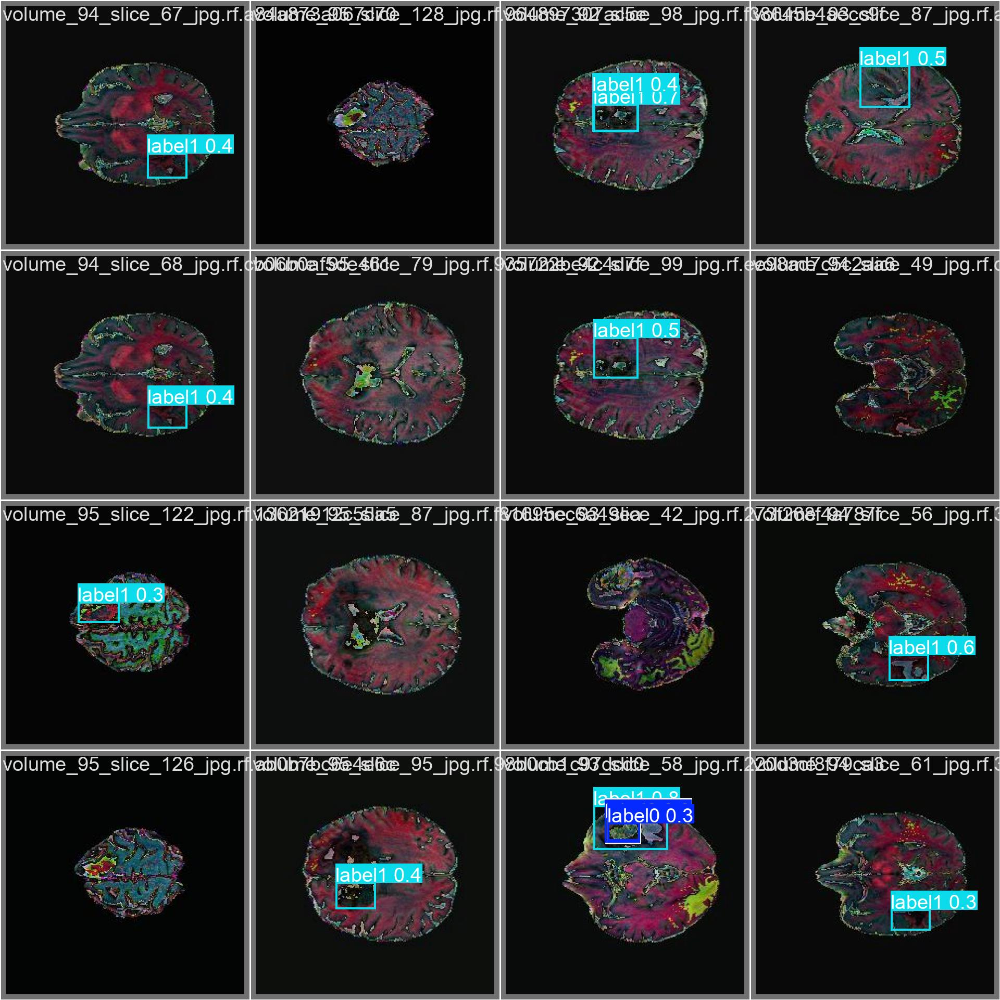

**Val Batch1 Labels**

This image shows a batch of validation images with their ground truth bounding box labels, which can be compared against the model's predictions (e.g., `val_batch1_pred.jpg`).

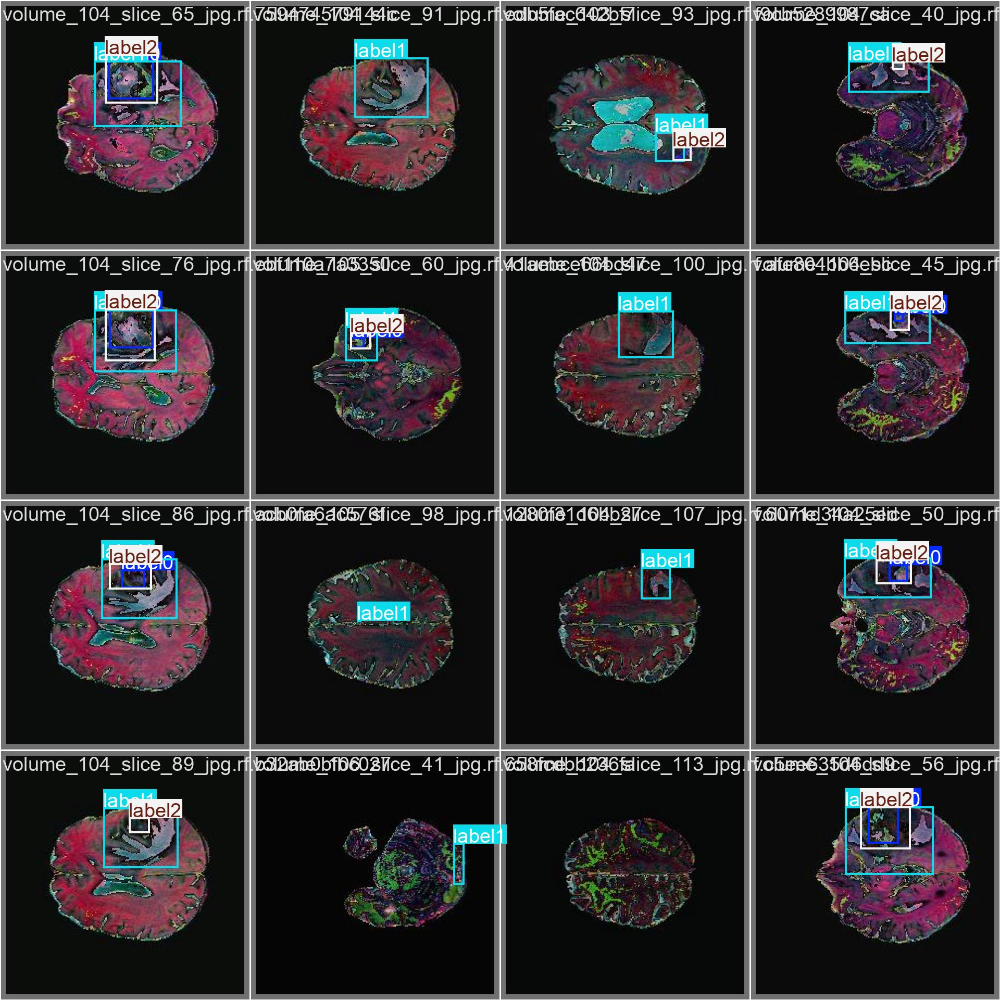

**Val Batch1 Pred**

This image shows a batch of validation images with the model's predicted bounding boxes and detected objects, allowing for a visual assessment of its performance on unseen data.

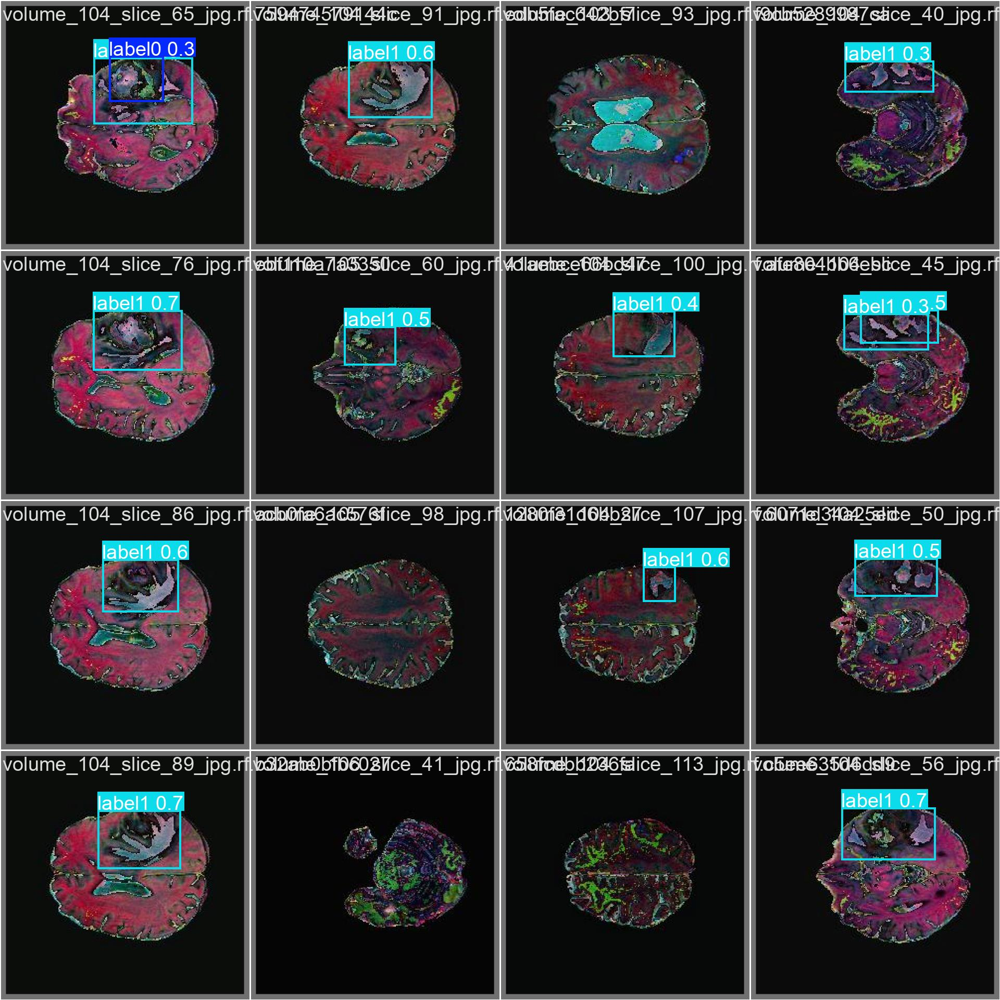

**Val Batch2 Labels**

This image shows a batch of validation images with their ground truth bounding box labels, which can be compared against the model's predictions (e.g., `val_batch2_pred.jpg`).

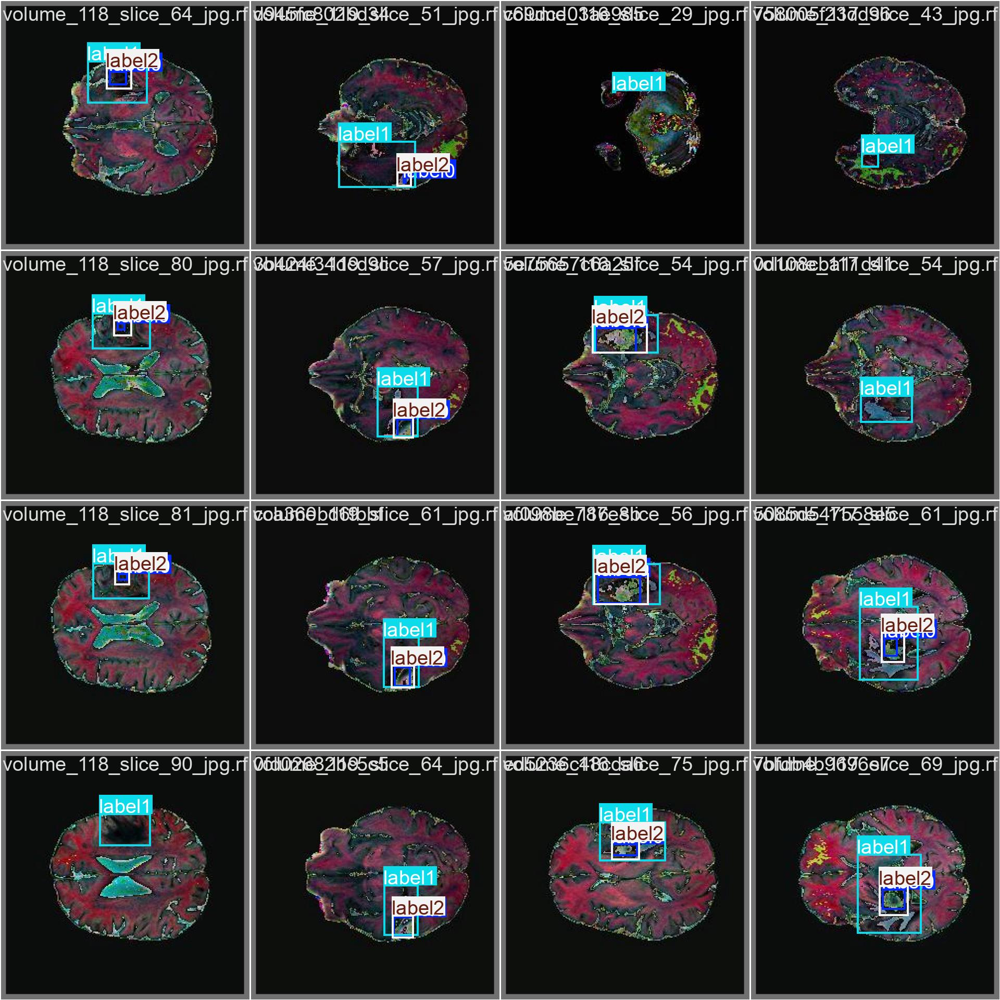

**Val Batch2 Pred**

This image shows a batch of validation images with the model's predicted bounding boxes and detected objects, allowing for a visual assessment of its performance on unseen data.

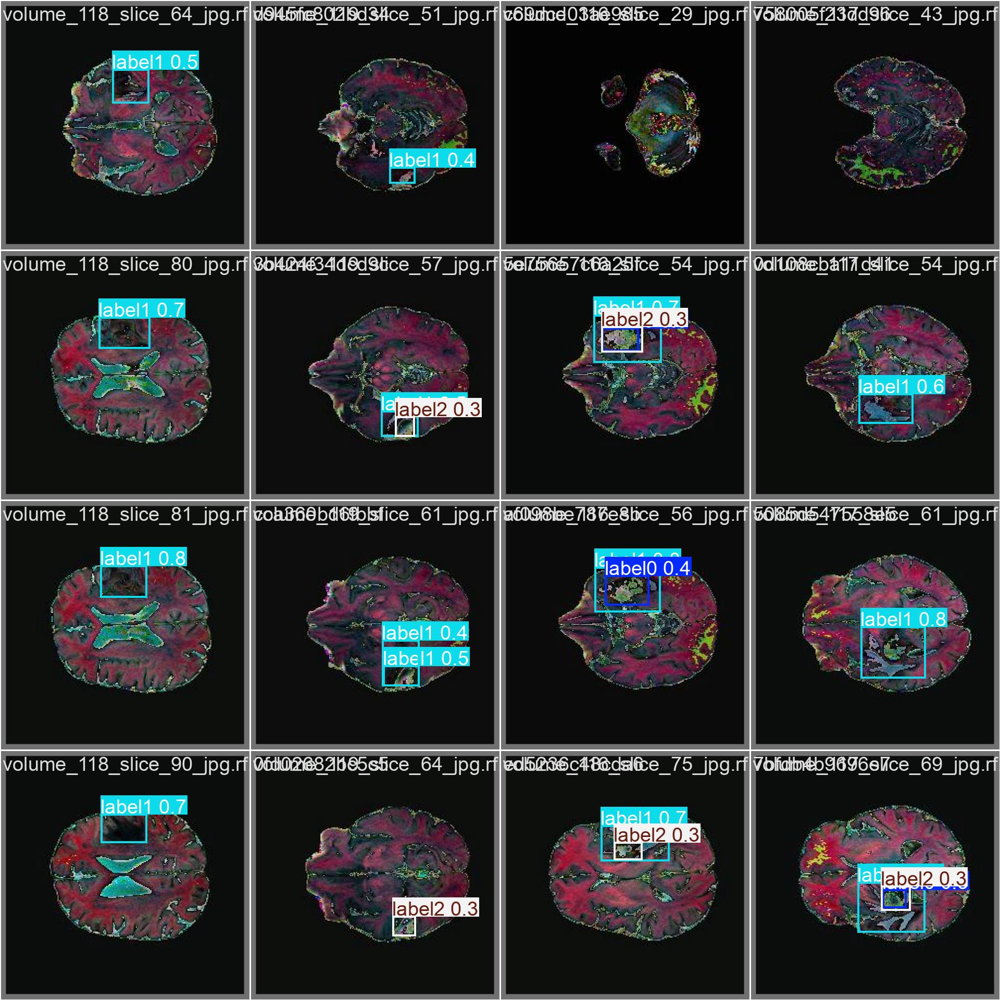

In [24]:
from IPython.display import Image as IPImage, display, Markdown
import glob
import os
import re # Import re for parsing image filenames

# Ensure plot_files is defined (it should be from Phase 9 if run previously)
# In case it's not, we'll re-run the logic to find the latest run directory
if 'plot_files' not in locals():
    runs_base_dir = 'runs/detect/brain_tumor_project'
    run_dirs = sorted(
        [d for d in glob.glob(os.path.join(runs_base_dir, 'yolov8_brain_tumor*')) if os.path.isdir(d)]
    )
    if run_dirs:
        latest_run = run_dirs[-1]
        plot_files = sorted(glob.glob(os.path.join(latest_run, '*.png')) + glob.glob(os.path.join(latest_run, '*.jpg')))
    else:
        plot_files = []

plot_explanations = {
    'BoxF1_curve.png': "This F1-score curve illustrates the balance between precision and recall for object detection at various confidence thresholds. A higher F1-score indicates better overall detection performance.",
    'BoxPR_curve.png': "The Precision-Recall (PR) curve is crucial for evaluating object detection models, especially with class imbalance. A larger Area Under the Curve (AUC) signifies superior model performance.",
    'BoxP_curve.png': "This graph shows the Precision curve, which represents the accuracy of positive predictions (true positives divided by true positives + false positives) across different confidence thresholds.",
    'BoxR_curve.png': "The Recall curve displays the model's ability to find all relevant instances (true positives divided by true positives + false negatives) at various confidence thresholds.",
    'confusion_matrix.png': "The confusion matrix provides a detailed breakdown of correct and incorrect predictions for each class, helping to identify which categories the model might be confusing.",
    'confusion_matrix_normalized.png': "This normalized confusion matrix shows the proportion of predictions, making it easier to compare classification performance across classes, especially when class sizes are uneven.",
    'labels.jpg': "This plot visualizes the distribution of object labels (bounding box centers and dimensions) in your dataset, which can help in identifying potential biases or anomalies in the data.",
    'labels_correlogram.jpg': "The labels correlogram illustrates the correlation between different bounding box attributes (like width, height, and aspect ratio), useful for understanding label consistency and potential data issues.",
    'results.png': "This 'results.png' plot offers a comprehensive overview of the training process, displaying various metrics such as loss (box, object, classification), mAP, precision, and recall over the training epochs.",
    'train_batch0.jpg': "This image displays a batch of training images with their ground truth bounding box labels, providing a visual inspection of the data the model was trained on.",
    'train_batch1.jpg': "This image displays a batch of training images with their ground truth bounding box labels, providing a visual inspection of the data the model was trained on.",
    'train_batch2.jpg': "This image displays a batch of training images with their ground truth bounding box labels, providing a visual inspection of the data the model was trained on.",
    'val_batch0_pred.jpg': "This image shows a batch of validation images with the model's predicted bounding boxes and detected objects, allowing for a visual assessment of its performance on unseen data.",
    'val_batch1_pred.jpg': "This image shows a batch of validation images with the model's predicted bounding boxes and detected objects, allowing for a visual assessment of its performance on unseen data.",
    'val_batch2_pred.jpg': "This image shows a batch of validation images with the model's predicted bounding boxes and detected objects, allowing for a visual assessment of its performance on unseen data.",
    'val_batch0_labels.jpg': "This image shows a batch of validation images with their ground truth bounding box labels, which can be compared against the model's predictions (e.g., `val_batch0_pred.jpg`).",
    'val_batch1_labels.jpg': "This image shows a batch of validation images with their ground truth bounding box labels, which can be compared against the model's predictions (e.g., `val_batch1_pred.jpg`).",
    'val_batch2_labels.jpg': "This image shows a batch of validation images with their ground truth bounding box labels, which can be compared against the model's predictions (e.g., `val_batch2_pred.jpg`)."
}

# Group plot files by category for better presentation
plot_categories = {
    'Performance Curves': ['BoxPR_curve.png', 'BoxP_curve.png', 'BoxR_curve.png', 'BoxF1_curve.png'],
    'Confusion Matrices': ['confusion_matrix.png', 'confusion_matrix_normalized.png'],
    'Label Distributions': ['labels.jpg', 'labels_correlogram.jpg'],
    'Overall Results': ['results.png'],
    'Training & Validation Batches': ['train_batch0.jpg', 'train_batch1.jpg', 'train_batch2.jpg',
                                      'val_batch0_labels.jpg', 'val_batch0_pred.jpg',
                                      'val_batch1_labels.jpg', 'val_batch1_pred.jpg',
                                      'val_batch2_labels.jpg', 'val_batch2_pred.jpg']
}

processed_files = set()

def populate_generated_cells(category_name, files_in_category):
    global generated_cells # Use global list

    # Add a markdown cell for the category title
    generated_cells.append({
        "cell_type": "markdown",
        "code": f"### {category_name}"
    })

    for plot_file_basename in files_in_category:
        # Find the full path for the current plot_file_basename in the available plot_files
        full_plot_path = next((f for f in plot_files if os.path.basename(f) == plot_file_basename), None)

        if full_plot_path and full_plot_path not in processed_files:
            processed_files.add(full_plot_path)
            explanation = plot_explanations.get(plot_file_basename, f"A plot related to model training: {plot_file_basename}")

            # Add markdown cell for explanation
            generated_cells.append({
                "cell_type": "markdown",
                "code": f"**{plot_file_basename.replace('_', ' ').replace('.png', '').replace('.jpg', '').title()}**\n\n{explanation}"
            })

            # Add code cell (will be parsed and displayed as image)
            generated_cells.append({
                "cell_type": "python",
                "code": f"display(IPImage(filename='{full_plot_path}', width=800))"
            })

generated_cells = []

# Populate generated_cells list with markdown and image display code
for category, files in plot_categories.items():
    populate_generated_cells(category, files)

# Add any remaining files that were not in categories
remaining_files = [f for f in plot_files if f not in processed_files]
if remaining_files:
    populate_generated_cells("Other Plots", [os.path.basename(f) for f in remaining_files])

# Display the plots directly within the output of this cell
for cell_info in generated_cells:
    if cell_info['cell_type'] == 'markdown':
        display(Markdown(cell_info['code']))
    elif cell_info['cell_type'] == 'python':
        # Parse the python code to extract the filename and display the image
        code_to_execute = cell_info['code']
        match = re.search(r"filename='([^']+)'", code_to_execute)
        if match:
            filename = match.group(1)
            if os.path.exists(filename):
                display(IPImage(filename=filename, width=800))
            else:
                display(Markdown(f"_Image not found: {filename}_\n"))
        else:
            # Fallback if parsing fails or unexpected python code
            display(Markdown(f"_Could not display image. Code was: `{code_to_execute}`_\n"))
